# ASA COURSEWORK 2
# Brand Analysis using Twitter/X
# ADIDAS VS LULULEMON BRAND COMPARISON

### THE ANALYSIS IS DIVIDED INTO 6 DIFFRENT PARTS:
### SECTION 1-DATA PREPROCESSING
### SECTION 2 -EXPOLATORY DATA ANALYSIS
### SECTION 3 -SENTIMENTAL ANALYSIS
### SECTION 4 -TOPIC MODELLING
### SECTION 5 -NETWORK ANALYSIS
### SECTION 6 -MICRO INFLUNCER IDENTIFICATION

[THIS ANALYSIS WAS DONE IN JUPYTER NOTEBOOK AND DATASETS WERE LOADED BY DOWNLOADING ON A DESKTOP.]

## Import libraries:

In [2]:
import pandas as pd
import numpy as np
import re
import string
import nltk
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
from itertools import chain
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans

Imports essential libraries for data manipulation, text preprocessing, visualization, sentiment analysis, and clustering.

## Load dataset:

In [3]:
# Load each dataset
adidas = pd.read_csv(r"C:\Users\Samiksha\Downloads\adidas_tweets.csv")
lululemon = pd.read_csv(r"C:\Users\Samiksha\Downloads\lululemon_tweets.csv")

In [4]:
# Add brand labels
adidas['brand'] = 'Adidas'
lululemon['brand'] = 'Lululemon'

In [5]:
# Combine into one DataFrame
df = pd.concat([adidas, lululemon], ignore_index=True)

# Preview the first few rows
df.head()

# Shape of each dataset
print(f"Adidas shape: {adidas.shape}")
print(f"Lululemon shape: {lululemon.shape}")
print(f"Combined shape: {df.shape}\n")

# Show columns
print(df.columns)

Adidas shape: (38212, 16)
Lululemon shape: (6190, 16)
Combined shape: (44402, 16)

Index(['created_at', 'id', 'full_text', 'is_quote_status', 'retweet_count',
       'favorite_count', 'user.id', 'user.name', 'user.screen_name',
       'user.location', 'user.followers_count', 'user.friends_count',
       'user.listed_count', 'user.verified', 'user.statuses_count', 'brand'],
      dtype='object')


Loaded tweet datasets for Adidas (38,212 rows) and Lululemon (6,190 rows), then combined them into a unified DataFrame for brand comparison, totaling 44,402 entries.
Each record contains tweet text, engagement metrics (likes, retweets), and user metadata (location, follower count), enabling sentiment analysis and audience behavior insights across both brands.

# Section 1
##  Data PreProcessing 
### A) Data Inspection and Cleaning:

Data preprocessing involves inspecting, cleaning, and transforming raw data to improve its quality and suitability for analysis.
It helps eliminate noise such as missing values, duplicates, and irrelevant characters, which could distort insights or bias model performance.
This step ensures the dataset is accurate, consistent, and ready for tasks like sentiment analysis and clustering.

In [6]:
# Show columns
print(df.columns)

Index(['created_at', 'id', 'full_text', 'is_quote_status', 'retweet_count',
       'favorite_count', 'user.id', 'user.name', 'user.screen_name',
       'user.location', 'user.followers_count', 'user.friends_count',
       'user.listed_count', 'user.verified', 'user.statuses_count', 'brand'],
      dtype='object')


In [7]:
# Check for null values
print(df.isna().sum())
# Shape of each dataset
print(f"Adidas shape: {adidas.shape}")
print(f"Lululemon shape: {lululemon.shape}")
print(f"Combined shape: {df.shape}")

created_at                  0
id                          0
full_text                   0
is_quote_status             0
retweet_count               0
favorite_count              0
user.id                     0
user.name                   0
user.screen_name            0
user.location           12147
user.followers_count        0
user.friends_count          0
user.listed_count           0
user.verified               0
user.statuses_count         0
brand                       0
dtype: int64
Adidas shape: (38212, 16)
Lululemon shape: (6190, 16)
Combined shape: (44402, 16)


Null value inspection shows user.location has 12,147 missing entries, while all other fields are complete.
The combined dataset consists of 44,402 tweets: 38,212 from Adidas and 6,190 from Lululemon, each with 16 attributes.

In [8]:
# Count of unique locations
print("Number of unique user locations:", df['user.location'].nunique())

# Display the most common locations (optional)
print("\nTop 10 most common user locations:")
print(df['user.location'].value_counts().head(10))

Number of unique user locations: 10642

Top 10 most common user locations:
user.location
United States      1285
Chicago, IL         532
California, USA     521
Los Angeles, CA     472
New York, NY        468
Miami, FL           415
USA                 338
New York, USA       321
Florida, USA        289
Texas, USA          253
Name: count, dtype: int64


There are 10,642 unique user location entries, indicating high variability and inconsistency in how users report their location.
The most common locations are U.S.-based, with "United States" leading, followed by major cities like Chicago, Los Angeles, and New York.

In [9]:
# Preview before any cleaning
print("Before cleaning:")
display(df.head())

# Null count
print("Missing values per column:")
print(df.isna().sum().sort_values(ascending=False))

# Filter out empty or null full_text
df = df[df['full_text'].notna() & (df['full_text'].str.strip() != '')]

# Preview after drop
print("\nAfter removing empty tweets:")
display(df.head())

Before cleaning:


,created_at,id,full_text,is_quote_status,retweet_count,favorite_count,user.id,user.name,user.screen_name,user.location,user.followers_count,user.friends_count,user.listed_count,user.verified,user.statuses_count,brand
0,2021-10-01 07:37:16+00:00,1443842433641558000,@_christiankeith @d1vetsam @KicksFinder They a...,False,0,0,723347581586255900,Nate,NateRuns5,NaN,117,240,0,False,11259,Adidas
1,2021-10-01 11:00:25+00:00,1443893560680456200,SELENA boosted up Puma stocks by 40% Her part...,False,0,0,281283506,La Revelacion,BoysRevelacion,NaN,790,324,4,False,90265,Adidas
2,2021-10-01 07:13:08+00:00,1443836362394849300,RT @R_Riakporhe: It’s been a real struggle to ...,False,3,0,492598592,Ayden Callaghan,AydenCallaghan,instagram Aydencallaghan,78926,1513,66,True,36428,Adidas
3,2021-10-01 10:05:13+00:00,1443879669149970400,@adidasUS @adidasoriginals looks like this pro...,True,0,0,259097925,krZzz,datzallright,Here,206,1641,4,False,5526,Adidas
4,2021-10-01 07:51:43+00:00,1443846070447059000,@NateRuns5 @d1vetsam @KicksFinder @adidas Stil...,False,0,0,342395526,🐝,_christiankeith,"North Carolina, USA",804,375,6,False,104576,Adidas


Missing values per column:
user.location           12147
created_at                  0
id                          0
full_text                   0
is_quote_status             0
retweet_count               0
favorite_count              0
user.id                     0
user.name                   0
user.screen_name            0
user.followers_count        0
user.friends_count          0
user.listed_count           0
user.verified               0
user.statuses_count         0
brand                       0
dtype: int64

After removing empty tweets:


,created_at,id,full_text,is_quote_status,retweet_count,favorite_count,user.id,user.name,user.screen_name,user.location,user.followers_count,user.friends_count,user.listed_count,user.verified,user.statuses_count,brand
0,2021-10-01 07:37:16+00:00,1443842433641558000,@_christiankeith @d1vetsam @KicksFinder They a...,False,0,0,723347581586255900,Nate,NateRuns5,NaN,117,240,0,False,11259,Adidas
1,2021-10-01 11:00:25+00:00,1443893560680456200,SELENA boosted up Puma stocks by 40% Her part...,False,0,0,281283506,La Revelacion,BoysRevelacion,NaN,790,324,4,False,90265,Adidas
2,2021-10-01 07:13:08+00:00,1443836362394849300,RT @R_Riakporhe: It’s been a real struggle to ...,False,3,0,492598592,Ayden Callaghan,AydenCallaghan,instagram Aydencallaghan,78926,1513,66,True,36428,Adidas
3,2021-10-01 10:05:13+00:00,1443879669149970400,@adidasUS @adidasoriginals looks like this pro...,True,0,0,259097925,krZzz,datzallright,Here,206,1641,4,False,5526,Adidas
4,2021-10-01 07:51:43+00:00,1443846070447059000,@NateRuns5 @d1vetsam @KicksFinder @adidas Stil...,False,0,0,342395526,🐝,_christiankeith,"North Carolina, USA",804,375,6,False,104576,Adidas


Initial data inspection reveals that while most fields are complete, the user.location column contains 12,147 missing values.
Empty or null full_text entries were removed to ensure only valid tweets are retained for further analysis, preserving data relevance and quality.

## B) Text PreProcessing

In [79]:
# Download necessary NLTK data (only once)
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

# Setup stopwords and lemmatizer
stop = set(stopwords.words('english'))
lemmatizer = WordNetLemmatizer()

# Cleaning function
def clean_tweet(text):
    text = str(text).lower()  # Lowercase
    text = re.sub(r"http\S+|www\S+", '', text)  # Remove URLs
    text = re.sub(r"@\w+|\#", '', text)  # Remove mentions and hashtags
    text = re.sub(r"\d+", '', text)  # Remove digits
    text = text.translate(str.maketrans('', '', string.punctuation))  # Remove punctuation
    text = re.sub(r"[^\x00-\x7F]+", '', text)  # Remove emojis and non-ASCII chars
    text = re.sub(r'\s+', ' ', text).strip()  # Normalize spaces
    words = text.split()
    words = [lemmatizer.lemmatize(word) for word in words if word not in stop and len(word) > 2]
    return ' '.join(words)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Samiksha\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Samiksha\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Samiksha\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


This section sets up text preprocessing by downloading necessary NLTK resources and defining a cleaning function.
The clean_tweet() function standardizes text by removing URLs, mentions, punctuation, digits, emojis, and stopwords, and applies lemmatization to reduce words to their root forms—crucial for accurate text analysis.

In [80]:
# Apply to full_text column to generate clean_text
df['clean_text'] = df['full_text'].apply(clean_tweet)

# Preview cleaned output
df[['full_text', 'clean_text']].head()

,full_text,clean_text
0,@_christiankeith @d1vetsam @KicksFinder They are available too at @adidas,available
1,SELENA boosted up Puma stocks by 40% Her partnership helped Puma grow faster than rivals @Adidas & @Nike https://t.co/uRKsuz32lj,selena boosted puma stock partnership helped puma grow faster rival
2,"RT @R_Riakporhe: It’s been a real struggle to get here but without the support of the Riakporhe army, @adidas, close friends & family it wo…",real struggle get without support riakporhe army close friend family
3,@adidasUS @adidasoriginals looks like this problem solver is wearing @adidas slides🤘 https://t.co/wcPUbj7TIq,look like problem solver wearing slide
4,@NateRuns5 @d1vetsam @KicksFinder @adidas Still says they drop sept 19 for me 😵‍💫,still say drop sept


In [81]:
print("Shape before:", df.shape)
print("Before filling missing user.location:")
print("Nulls in user.location:", df['user.location'].isna().sum())
df['user.location'].replace('', pd.NA, inplace=True)
df['user.location'] = df['user.location'].fillna('Unknown')
print("After filling user.location:")
print("Nulls in user.location:", df['user.location'].isna().sum())

Shape before: (44402, 17)
Before filling missing user.location:
Nulls in user.location: 12147
After filling user.location:
Nulls in user.location: 0


C:\Users\Samiksha\AppData\Local\Temp\ipykernel_38712\3164423743.py:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['user.location'].replace('', pd.NA, inplace=True)


Missing values in the user.location column (12,147) were filled with 'Unknown' to retain these records without introducing nulls.

In [82]:
print("Before dropping duplicates:")
print("Shape before:", df.shape)
df = df.drop_duplicates(subset='id')
print("After dropping duplicates:")
print("Shape after:", df.shape)

Before dropping duplicates:
Shape before: (44402, 17)
After dropping duplicates:
Shape after: (44380, 17)


Duplicate tweets based on the id column were removed, reducing the dataset from 44,402 to 44,380 unique entries.
This step ensures the analysis is not biased by repeated content and maintains the integrity of insights derived from the data.

In [83]:
df = df.reset_index(drop=True)
print("Sample data preview:")
display(df[['created_at', 'user.screen_name', 'full_text', 'user.location', 'clean_text']].head(10))
print(df.dtypes)

Sample data preview:


,created_at,user.screen_name,full_text,user.location,clean_text
0,2021-10-01 07:37:16+00:00,NateRuns5,@_christiankeith @d1vetsam @KicksFinder They are available too at @adidas,Unknown,available
1,2021-10-01 11:00:25+00:00,BoysRevelacion,SELENA boosted up Puma stocks by 40% Her partnership helped Puma grow faster than rivals @Adidas & @Nike https://t.co/uRKsuz32lj,Unknown,selena boosted puma stock partnership helped puma grow faster rival
2,2021-10-01 07:13:08+00:00,AydenCallaghan,"RT @R_Riakporhe: It’s been a real struggle to get here but without the support of the Riakporhe army, @adidas, close friends & family it wo…",instagram Aydencallaghan,real struggle get without support riakporhe army close friend family
3,2021-10-01 10:05:13+00:00,datzallright,@adidasUS @adidasoriginals looks like this problem solver is wearing @adidas slides🤘 https://t.co/wcPUbj7TIq,Here,look like problem solver wearing slide
4,2021-10-01 07:51:43+00:00,_christiankeith,@NateRuns5 @d1vetsam @KicksFinder @adidas Still says they drop sept 19 for me 😵‍💫,"North Carolina, USA",still say drop sept
5,2021-10-01 09:43:02+00:00,TraeKicks,The Adidas Trae Young 1 “ICEE” is available on @adidas ❄️❄️❄️❄️ @TheTraeYoung @rayfordyoung https://t.co/hX27LEUsFQ,"Oklahoma City, OK",adidas trae young icee available
6,2021-10-01 09:20:19+00:00,susd4life,there doesnt seem to be much middle ground with these. people either like them or dont. what about you? https://t.co/ZlGH76YlNk @adidas #adidas #seanwotherspoon #jiminycricket #superturfadventure,"Virginia, USA",doesnt seem much middle ground people either like dont adidas seanwotherspoon jiminycricket superturfadventure
7,2021-10-01 09:36:09+00:00,thumbsocial,@Asante_Jedi @TheyScoredNone @dontblink_27 @adidas And yet you have never played rugby. Name one Asian who has lol,"England, United Kingdom",yet never played rugby name one asian lol
8,2021-10-01 09:37:54+00:00,simonsaysyeah,@Asante_Jedi @nattydreadsta @adidas Then only deal with black run companies. Its your choice.,Unknown,deal black run company choice
9,2021-10-01 07:00:16+00:00,R_Riakporhe,"It’s been a real struggle to get here but without the support of the Riakporhe army, @adidas, close friends & family it would have been just wishful dreaming. A massive thank you to all who have shown support & my great team. We’re just getting started! @cmckennasport 🙏🏿🙏🏿👌🏿 https://t.co/cjywFWPJvx",London,real struggle get without support riakporhe army close friend family would wishful dreaming massive thank shown support great team getting started


created_at              object
id                       int64
full_text               object
is_quote_status           bool
retweet_count            int64
favorite_count           int64
user.id                  int64
user.name               object
user.screen_name        object
user.location           object
user.followers_count     int64
user.friends_count       int64
user.listed_count        int64
user.verified             bool
user.statuses_count      int64
brand                   object
clean_text              object
dtype: object


In [84]:
# Check how many are blank
print("Blank clean_text rows:", (df['clean_text'].str.strip() == '').sum())

Blank clean_text rows: 8211


In [85]:
# Convert to datetime
df['created_at'] = pd.to_datetime(df['created_at'])
df['date'] = df['created_at'].dt.date

After text preprocessing, 8,211 tweets had blank clean_text fields, likely due to content composed entirely of stopwords, mentions, or non-alphabetic characters.
The created_at column was converted to datetime format, and a new date column was extracted to enable time-based analysis in the next stage.

# Section 2
# Expolatory Data Analysis:
## A) Tweet Analysis:

In [86]:
df.to_csv('cleaned_combined_tweets.csv', index=False)
print("Date Range Per Brand:")
print(df.groupby('brand')['created_at'].agg(['min', 'max']))

Date Range Per Brand:
                                min                       max
brand                                                        
Adidas    2021-10-01 07:00:16+00:00 2022-01-01 06:57:44+00:00
Lululemon 2021-10-01 09:58:19+00:00 2022-01-01 05:29:34+00:00


In [87]:
print("Tweet count by brand:\n")
print(df['brand'].value_counts())

Tweet count by brand:

brand
Adidas       38211
Lululemon     6169
Name: count, dtype: int64


In [88]:
print("Unique Users Per Brand:\n")
print(df.groupby('brand')['user.id'].nunique())

Unique Users Per Brand:

brand
Adidas       29144
Lululemon     4446
Name: user.id, dtype: int64


In [89]:
print("Total Tweet Count:\n")
print(df['brand'].value_counts())

Total Tweet Count:

brand
Adidas       38211
Lululemon     6169
Name: count, dtype: int64


In [90]:
print("Total Days Covered Per Brand:\n")
print(df.groupby('brand')['date'].nunique())

Total Days Covered Per Brand:

brand
Adidas       93
Lululemon    93
Name: date, dtype: int64


In [91]:
print("Average Tweets per Day Per Brand:\n")
avg_tweets_per_day = df.groupby(['brand', 'date']).size().groupby('brand').mean().round(2)
print(avg_tweets_per_day)

Average Tweets per Day Per Brand:

brand
Adidas       410.87
Lululemon     66.33
dtype: float64


In [92]:
print("Most Active Tweeting Day Per Brand: \n")
most_active = df.groupby(['brand', 'date']).size().reset_index(name='tweet_count')
print(most_active.loc[most_active.groupby('brand')['tweet_count'].idxmax()])

Most Active Tweeting Day Per Brand: 

         brand        date  tweet_count
17      Adidas  2021-10-18         4994
119  Lululemon  2021-10-27          264


The cleaned dataset was exported for persistence, and temporal analysis was conducted to understand brand activity over time. Both Adidas and Lululemon tweets span a 93-day period from October 1, 2021, to January 1, 2022, ensuring a consistent temporal baseline for comparison.
Adidas exhibited significantly higher engagement, with 38,211 tweets from 29,144 unique users, compared to Lululemon’s 6,169 tweets from 4,446 users. This suggests a broader user base and greater volume of brand-related discourse for Adidas.
On average, Adidas generated 410.87 tweets per day, nearly 6.2× more than Lululemon’s 66.33 tweets per day, indicating stronger daily interaction.
The most active dates—October 18 for Adidas (4,994 tweets) and October 27 for Lululemon (264 tweets)—may correspond to promotional events, product launches, or viral activity, and warrant deeper contextual investigation to understand the drivers of peak engagement.

In [93]:
# Filter Lululemon tweets that mention both 'healthcare' and 'discount' (case-insensitive)
lululemon_healthcare_discount = df[
    (df['brand'] == 'Lululemon') &
    (df['full_text'].str.contains('healthcare', case=False, na=False)) &
    (df['full_text'].str.contains('discount', case=False, na=False))
]

# Show key info
lululemon_healthcare_discount[['user.screen_name', 'full_text', 'retweet_count', 'favorite_count']]


,user.screen_name,full_text,retweet_count,favorite_count
38253,maaartha_g,"Did not know @lululemon offers a discount to healthcare workers, thank you! (Have to show your badge in-store)",0,0
38408,jennnn98,@lululemon really comes in clutch with their healthcare workers discount 😎,0,0
38437,BHuminskiSW,"Hey, @lululemon please keep your healthcare worker discount (and keep including social workers). We are exhausted…It’s truly meant a lot to me and I just heard it’s changing. Thank you! #MedTwitter #psychtwitter #SocialWorkTwitter",1,10
38838,BHuminskiSW,Reframing to thank @lululemon for having and keeping the healthcare worker discount for so long. Haven’t updated my fitness clothing in a very long time and this helped me do so. It’s small but meaningful. Thanks again! #SocialWorkTwitter #medtwitter #psychtwitter,0,1
38892,tylappy,@lululemon are other healthcare workers going to get added to the First Responders discount? Sorry that we’re not all doctors & nurses🙃🙃🙃,0,0
...,...,...,...,...
44273,llhovey,"@lululemon I’d like to learn why lululemon feels my frontline job as a respiratory therapist (literally intubating and taking care of covid patients on life support) isn’t special enough, only doctors and nurses keep the 25% discount. Either give it to all healthcare or none.",0,1
44284,FullSpedAhead,@lululemon @mattjames919 How about explaining why you exclude almost all healthcare workers from your discount program unless they are a doctor or nurse? PAs for example?,0,1
44285,FullSpedAhead,@lululemon I would like to learn why the healthcare discount isn't offered to my husband who is a PA working in the emergency room since the start of this pandemic (and currently).,0,0
44286,FullSpedAhead,@lululemon You can begin again by restructuring your healthcare discount program to include all critical healthcare workers not just doctors and nurses.,0,1


In [94]:
import re

# Define the keyword pattern
keywords = ['wellbeing']
pattern = '|'.join(keywords)  # creates 'today|day|new|hour|...'

# Filter tweets
lululemon_timing_related = df[
    (df['brand'] == 'Lululemon') &
    (df['full_text'].str.contains(pattern, flags=re.IGNORECASE, na=False))
]

# Display relevant columns
lululemon_timing_related[['user.screen_name', 'full_text', 'retweet_count', 'favorite_count']]


,user.screen_name,full_text,retweet_count,favorite_count
38593,calvinmcdonald,"In advance of World Mental Health Day, we are proud to launch the @lululemon Centre for Social Impact and support @girlsalliance, @NAMICommunicate, and @TrevorProject. Read about our partners and ongoing commitment to disrupt inequity in wellbeing. https://t.co/OptzyLUGZc",4,29
38643,DevynCretz,RT @lululemon: There are 24 hours in the day. Take at least one for yourself—your wellbeing matters.,151,0
38649,aangelinamiller,RT @lululemon: There are 24 hours in the day. Take at least one for yourself—your wellbeing matters.,151,0
38653,NicolaiMoore00,RT @lululemon: There are 24 hours in the day. Take at least one for yourself—your wellbeing matters.,151,0
38656,DejaRiley,RT @lululemon: There are 24 hours in the day. Take at least one for yourself—your wellbeing matters.,151,0
...,...,...,...,...
40771,Kmeemk,RT @lululemon: PSA: The road to wellbeing doesn’t get easier—the goals just get bigger.,33,0
40772,AleeHabib,RT @lululemon: PSA: The road to wellbeing doesn’t get easier—the goals just get bigger.,33,0
40849,Campbell5Morgan,RT @lululemon: PSA: The road to wellbeing doesn’t get easier—the goals just get bigger.,33,0
40908,thebrandimsmith,RT @lululemon: There are 24 hours in the day. Take at least one for yourself—your wellbeing matters.,151,0


In [95]:
import re

# Define keyword list
keywords = ['coal', 'renewable', 'youth', 'holiday', 'supply', 'ditch', 'chain', 'energy']
pattern = '|'.join(keywords)  # e.g., 'coal|renewable|youth|...'

# Filter tweets for Lululemon
lululemon_misc_theme = df[
    (df['brand'] == 'Lululemon') &
    (df['full_text'].str.contains(pattern, flags=re.IGNORECASE, na=False))
]

# Display selected columns
lululemon_misc_theme[['user.screen_name', 'full_text', 'retweet_count', 'favorite_count']]


,user.screen_name,full_text,retweet_count,favorite_count
38221,pmarinelli04,.@lululemon please make commitments to switch to renewable energy in your supply chain. Your our brand has scored a “D-” in https://t.co/3Tnn52vjgH’s Fossil-Free Fashion Scorecard for your sustainability efforts.,0,0
38258,DrD0315,@SDSUsportsMBA @SeaWheeze @lululemon Love these signs given I ran all my life and collegiately too and my 4 kids are all nationally ranked youth cross country n TracknField sthletes and when I tell you that they are inspiring to any runner I really mean it! Great job and I look forward to meeting you all on Mon DrD,0,0
38286,BryerMM,I just tweeted @lululemon & @calvinmcdonald urging them to stop burning coal to make their famous yoga pants. Will you join me & the @standearth community? Tweet now if you don't want #CoalSweats: #thesweatlife https://t.co/GsxDlseOFR,0,0
38372,pmarinelli04,.@lululemon please make commitments to switch to renewable energy in your supply chain. Your our brand has scored a “D-” in https://t.co/3Tnn52vjgH’s Fossil-Free Fashion Scorecard for your sustainability efforts.,0,0
38423,enelgreenpower,.@lululemon’s commitment to renewable energy and a healthier planet is helping accelerate the clean energy transition. Learn how our partnership is helping reduce the athletic apparel company’s direct emissions footprint: https://t.co/hNVApCC29u,3,9
...,...,...,...,...
44213,sarahsinger10,"This holiday season, youth wish @lululemon would deliver climate leadership by stopping its coal pollution. @calvinmcdonald will you phase out coal & transition your company to 100% renewable energy? #lululemoncoalprit https://t.co/EdXLqXQ6uX",0,0
44262,AriGranDWT,".@lululemon, on this Boxing Day, I’m sharing youth activists’ wishlist for you & urge your brand to ditch coal & go 100% renewable in your supply chains. Will you commit to no coal by 2030 for a liveable future for younger generations? https://t.co/bwBN7ZMEkr",0,0
44318,lexmarieyoung,RT @lululemon: @lexmarieyoung Tis' the holiday season—treat yourself.,1,0
44335,joshkitlas,@lululemon this box could easily hold 30 of this product yet we only ordered one… #yoga #supplychain #brooklyn #Wow #waste https://t.co/cmRp6fqmjy,1,0


In [96]:
import re

# Define relevant keywords
keywords = ['shoe', 'look', 'like', 'love', 'xbox', 'thank', 'good', 'got', 'need', 'pair']
pattern = '|'.join(keywords)  # Build regex pattern

# Filter Adidas tweets
adidas_shoe_xbox_theme = df[
    (df['brand'] == 'Adidas') &
    (df['full_text'].str.contains(pattern, flags=re.IGNORECASE, na=False))
]

# Display relevant columns
adidas_shoe_xbox_theme[['user.screen_name', 'full_text', 'retweet_count', 'favorite_count']]


,user.screen_name,full_text,retweet_count,favorite_count
3,datzallright,@adidasUS @adidasoriginals looks like this problem solver is wearing @adidas slides🤘 https://t.co/wcPUbj7TIq,0,0
6,susd4life,there doesnt seem to be much middle ground with these. people either like them or dont. what about you? https://t.co/ZlGH76YlNk @adidas #adidas #seanwotherspoon #jiminycricket #superturfadventure,0,0
9,R_Riakporhe,"It’s been a real struggle to get here but without the support of the Riakporhe army, @adidas, close friends & family it would have been just wishful dreaming. A massive thank you to all who have shown support & my great team. We’re just getting started! @cmckennasport 🙏🏿🙏🏿👌🏿 https://t.co/cjywFWPJvx",3,65
12,CoachKamarBlue,"Aye those red @adidas practice unis or tuff, I need a jersey. #UAPB #ComeGetThatCulture #DaYard #HBCUsHoopToo #HBCUsAreDifferent https://t.co/FkYUtkHvGE",0,1
18,browner6,@adidas I bought a pair of blue sambas about 3-4 months ago one is light blue the other is darker blue ???,0,0
...,...,...,...,...
38193,BAITme,@GwadoMan @MarkMan23 @StreetFighter @adidas @adidasoriginals THANK YOU!,0,1
38194,ATLtrackclub,Look what's NEW in 2022. Swing by our merch tent and check out all of our #AtlantaTrackClub x @adidas gear! #ResolutionRun5K https://t.co/vzxdnYmqCJ,2,12
38195,StephRunsATL,RT @ATLtrackclub: Look what's NEW in 2022. Swing by our merch tent and check out all of our #AtlantaTrackClub x @adidas gear! #Resolutio…,2,0
38203,Cowboyfan_95,RT @DrKongz: Sports brands like @Nike @adidas @UnderArmour are gonna be all over @RumbleKongs. And maybe other fashion brands too. Do you s…,5,0


In [97]:
import re

# Define optional keywords (besides 'xbox')
optional_keywords = ['like', 'love', 'thank', 'good', 'got', 'need', 'pair']
optional_pattern = '|'.join(optional_keywords)  # OR condition for optional words

# Filter Adidas tweets where 'xbox' is present AND any of the optional words may appear
adidas_xbox_focus = df[
    (df['brand'] == 'Adidas') &
    (df['full_text'].str.contains('xbox', flags=re.IGNORECASE, na=False)) &
    (df['full_text'].str.contains(optional_pattern, flags=re.IGNORECASE, na=False))
]

# Display key details
adidas_xbox_focus[['user.screen_name', 'full_text', 'retweet_count', 'favorite_count']]


,user.screen_name,full_text,retweet_count,favorite_count
899,joshmunsee,@Commodus @Xbox @adidas Correct - this first pair (Xbox 20th Forum Mid ft. in video) is a promotional sneaker but will have a very limited number available for purchase - more details to follow on when and how. And we'll be announcing more sneakers that will be fully available for purchase by fans.,0,2
910,CheGoranov,@joshmunsee @Xbox @adidas Need these immediately 🔥💚,0,1
913,rudewood5,"@majornelson @adidas They look dope... I want me a pair, but will they be as hard to get as the #XboxSeriesX",0,7
920,joshmunsee,Just like games were meant to be played. Sneakers were meant to be played in 👟🎮💚🛹🤘 Excited to announce @xbox & @adidas are collaborating on a series of sneakers for #Xbox20 anniversary and beyond. #xbox #adidas https://t.co/8A6Wgdm2Lc https://t.co/y4r3pDlXp8,9,56
952,blaze187ace,"If I'm lucky to get a pair, I will #Xbox #adidas https://t.co/vy0u6fPEQN",0,1
...,...,...,...,...
37689,SomDr0id,"@Delilah_HD @Xbox @adidas Didn’t know they dropped a black mid, i need em to complete my set",0,0
37864,Mahat_Mama,"To everyone who got their feet on (see what I did there?) some of the @Xbox @adidas collabs, how did you lace yours? Any @XboxAmbassadors want to share? This is how I did mine ✨🥰 #Xbox20 Drop your pic here! ⬇️ https://t.co/4yPsd6lku4",1,8
37865,Viperwildebeest,"RT @Mahat_Mama: To everyone who got their feet on (see what I did there?) some of the @Xbox @adidas collabs, how did you lace yours? Any…",1,0
37927,BobSmit93897966,"@MissDeusGeek @Xbox @JDSports @adidas If they’re fake, they’re good looking fakes! I wish I had some!",0,0


In [98]:
print("First Tweet Per Brand:\n")
display(df.groupby('brand').apply(lambda x: x.sort_values('created_at').head(1))[['created_at', 'full_text']])

print("\n Last Tweet Per Brand:\n")
display(df.groupby('brand').apply(lambda x: x.sort_values('created_at', ascending=False).head(1))[['created_at', 'full_text']])

First Tweet Per Brand:



C:\Users\Samiksha\AppData\Local\Temp\ipykernel_38712\1581626282.py:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  display(df.groupby('brand').apply(lambda x: x.sort_values('created_at').head(1))[['created_at', 'full_text']])


,,created_at,full_text
brand,,,
Adidas,9,2021-10-01 07:00:16+00:00,"It’s been a real struggle to get here but without the support of the Riakporhe army, @adidas, close friends & family it would have been just wishful dreaming. A massive thank you to all who have shown support & my great team. We’re just getting started! @cmckennasport 🙏🏿🙏🏿👌🏿 https://t.co/cjywFWPJvx"
Lululemon,38213,2021-10-01 09:58:19+00:00,RT @Mom_Junky: Leggings can be intimidating! I’ve only purchased jackets and accessories from #lululemon. Shoutout to Shruthi @lululemon @D…



 Last Tweet Per Brand:



C:\Users\Samiksha\AppData\Local\Temp\ipykernel_38712\1581626282.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  display(df.groupby('brand').apply(lambda x: x.sort_values('created_at', ascending=False).head(1))[['created_at', 'full_text']])


,,created_at,full_text
brand,,,
Adidas,38208,2022-01-01 06:57:44+00:00,RT @ahnichols22: On January 2nd between 2-3 PM ET I will be featured on @nbc so tune in for the full thing!!! #GBO #VFL @AABonNBC @adidas h…
Lululemon,44379,2022-01-01 05:29:34+00:00,"RT @ACoutrouzas: Hey @lululemon, obsessed with your clothes and felt so honored and appreciated when you extended your discount to all heal…"


In [99]:
def classify_tweet(row):
    if row['full_text'].startswith("RT "):
        return "Retweet"
    elif row['is_quote_status']:
        return "Quote"
    else:
        return "Original"

df['tweet_type'] = df.apply(classify_tweet, axis=1)

In [100]:
# Counts
print("Tweet Types (Overall): \n")
print(df['tweet_type'].value_counts())

print("\nTweet Types Per Brand:\n")
print(df.groupby('brand')['tweet_type'].value_counts())

Tweet Types (Overall): 

tweet_type
Original    27656
Retweet     15497
Quote        1227
Name: count, dtype: int64

Tweet Types Per Brand:

brand      tweet_type
Adidas     Original      22996
           Retweet       14144
           Quote          1071
Lululemon  Original       4660
           Retweet        1353
           Quote           156
Name: count, dtype: int64


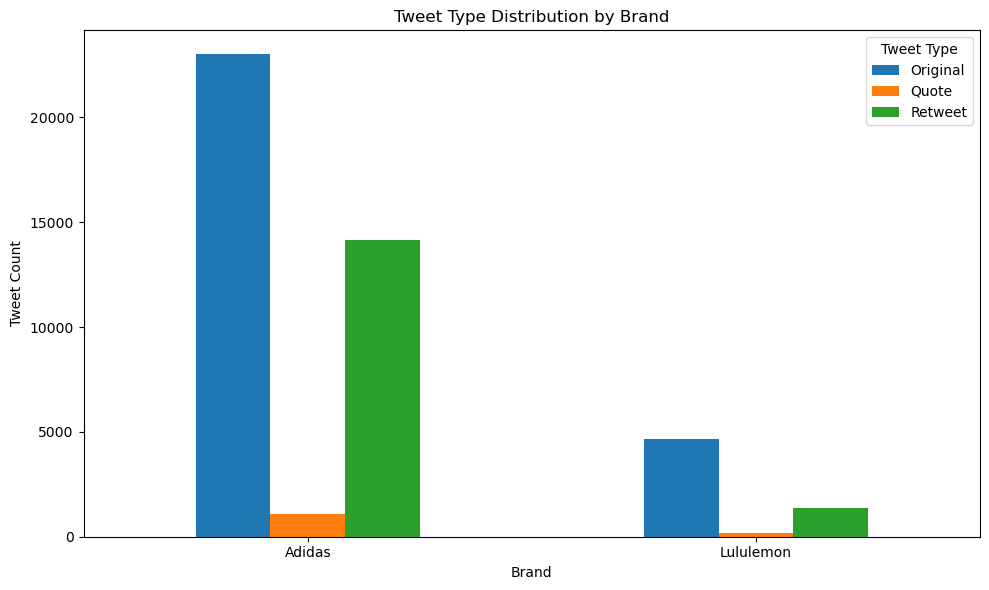

In [101]:
# Count of tweet types per brand
tweet_type_counts = df.groupby(['brand', 'tweet_type']).size().unstack().fillna(0)

# Plot as grouped bar chart
tweet_type_counts.plot(kind='bar', figsize=(10, 6))
plt.title('Tweet Type Distribution by Brand')
plt.xlabel('Brand')
plt.ylabel('Tweet Count')
plt.xticks(rotation=0)
plt.legend(title='Tweet Type')
plt.tight_layout()
plt.show()

In [102]:
# Word count from cleaned text
df['word_count'] = df['clean_text'].apply(lambda x: len(x.split()))

# Char count from original full text
df['char_count'] = df['full_text'].apply(len)

# Summary per brand
print("Average word and char counts per brand:\n")
print(df.groupby('brand')[['word_count', 'char_count']].mean().round(1))

Average word and char counts per brand:

           word_count  char_count
brand                            
Adidas            6.6       113.6
Lululemon         8.5       126.5


To analyze brand-specific tweet patterns, the earliest and latest tweets per brand were identified, confirming that both Adidas and Lululemon have consistent temporal coverage between October 1, 2021, and January 1, 2022. This confirms dataset alignment across time for comparative analysis.
Tweets were categorized as Original, Retweet, or Quote, revealing that Adidas posted a higher volume in all categories, particularly original tweets (22,996 vs. 4,660), suggesting more direct brand engagement.
On average, Lululemon tweets contain more words (8.5) and characters (126.5) than Adidas tweets (6.6 words, 113.6 characters), possibly reflecting more detailed or descriptive communication.

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


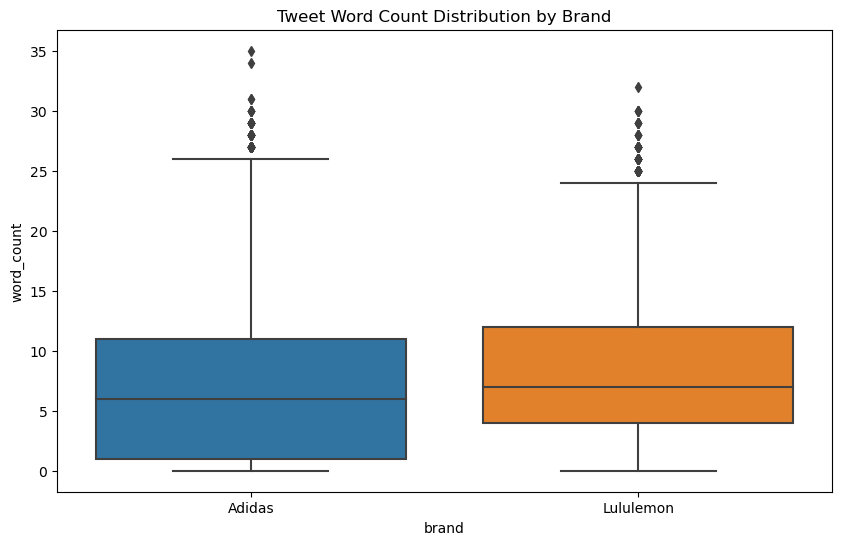

In [103]:
plt.figure(figsize=(10,6))
sns.boxplot(data=df, x='brand', y='word_count')
plt.title('Tweet Word Count Distribution by Brand')
plt.show()

In [104]:
df['hashtag_count'] = df['full_text'].apply(lambda x: x.count('#'))

print("Average hashtag count per brand:")
print(df.groupby('brand')['hashtag_count'].mean().round(2))

Average hashtag count per brand:
brand
Adidas       0.59
Lululemon    0.29
Name: hashtag_count, dtype: float64


In [105]:
def count_mentions(text):
    return len(re.findall(r'@\w+', text))

df['mention_count'] = df['full_text'].apply(count_mentions)

print("Average mention count per brand:")
print(df.groupby('brand')['mention_count'].mean().round(2))


Average mention count per brand:
brand
Adidas       3.17
Lululemon    2.44
Name: mention_count, dtype: float64


Hashtag usage is higher in Adidas tweets (0.59 hashtags/tweet) compared to Lululemon (0.29), indicating stronger use of tagging strategies for visibility or campaigns.
Similarly, Adidas tweets mention more users on average (3.17 mentions/tweet) than Lululemon (2.44), suggesting broader user engagement or conversational activity within tweets.
A boxplot visualization of word counts further supports that Lululemon tweets tend to be longer, but Adidas shows a wider distribution, potentially due to more retweets and replies with minimal text.

In [106]:
!pip install textblob

In [107]:
from textblob import TextBlob
# Apply sentiment polarity
df['sentiment'] = df['clean_text'].apply(lambda x: TextBlob(x).sentiment.polarity)

# Preview sentiment range
df['sentiment'].describe()

count    44380.000000
mean         0.175442
std          0.358117
min         -1.000000
25%          0.000000
50%          0.000000
75%          0.375000
max          1.000000
Name: sentiment, dtype: float64

In [108]:
df.head()              # First 5 rows
df.info()              # Summary of all columns and types
df.columns.tolist()    # All column names
df.sample(5)           # Random rows

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44380 entries, 0 to 44379
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype              
---  ------                --------------  -----              
 0   created_at            44380 non-null  datetime64[ns, UTC]
 1   id                    44380 non-null  int64              
 2   full_text             44380 non-null  object             
 3   is_quote_status       44380 non-null  bool               
 4   retweet_count         44380 non-null  int64              
 5   favorite_count        44380 non-null  int64              
 6   user.id               44380 non-null  int64              
 7   user.name             44380 non-null  object             
 8   user.screen_name      44380 non-null  object             
 9   user.location         44380 non-null  object             
 10  user.followers_count  44380 non-null  int64              
 11  user.friends_count    44380 non-null  int64              
 12  user

,created_at,id,full_text,is_quote_status,retweet_count,favorite_count,user.id,user.name,user.screen_name,user.location,...,user.statuses_count,brand,clean_text,date,tweet_type,word_count,char_count,hashtag_count,mention_count,sentiment
16228,2021-10-19 04:42:01+00:00,1450321312723861500,"RT @Xbox: Three icons: @adidas, Xbox, and you. Follow & RT with #XboxSweepstakes for a chance to win this exclusive kit including the Xbox…",False,19396,0,2313324612,Nick,k1ng_g2unt,"West Wendover, NV",...,2415,Adidas,three icon xbox follow xboxsweepstakes chance win exclusive kit including xbox,2021-10-19,Retweet,11,140,1,2,0.8
26087,2021-11-24 10:47:30+00:00,1463459252383764500,#NewProfilePic WHO DIS *Shout out to @adidas and Battersea track for the pic & that lighting 😅😘 https://t.co/LVieWZJnNC,False,0,0,216646238,Ollie,kettleinho,Unknown,...,38399,Adidas,newprofilepic dis shout battersea track pic lighting,2021-11-24,Original,7,120,1,1,0.0
42827,2021-12-10 21:10:26+00:00,1469414224921251800,@lululemon where is my stuff.,False,0,0,273719959,Versace Mirror Tint,MarcoBomaye,Know Your Role Blvd.,...,28094,Lululemon,stuff,2021-12-10,Original,1,29,0,1,0.0
11859,2021-10-18 15:18:59+00:00,1450119224177750000,"RT @Xbox: Three icons: @adidas, Xbox, and you. Follow & RT with #XboxSweepstakes for a chance to win this exclusive kit including the Xbox…",False,19396,0,29011316,Jeffrey,KozEffect,Arvada,...,9311,Adidas,three icon xbox follow xboxsweepstakes chance win exclusive kit including xbox,2021-10-18,Retweet,11,140,1,2,0.8
20960,2021-11-02 16:22:19+00:00,1455570979946647600,@zadyLion @bajabiri @JustFittz @adidas 30k na namba au herufi 5 humo humo plane ni 25k ukipita kwenye chipping ina_expire🤣🤣,False,0,0,618819520,BöBAli🇵🇸,Ngodi65,Dar es Salaam🇹🇿,...,3624,Adidas,namba herufi humo humo plane ukipita kwenye chipping inaexpire,2021-11-02,Original,9,123,0,4,0.0


In [109]:
# Already done sentiment, now add subjectivity
df['subjectivity'] = df['clean_text'].apply(lambda x: TextBlob(x).sentiment.subjectivity)

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


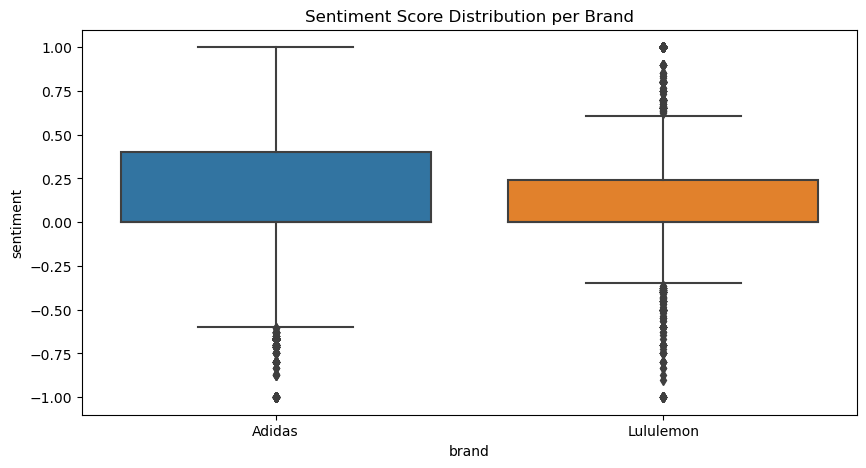

In [110]:
plt.figure(figsize=(10,5))
sns.boxplot(data=df, x='brand', y='sentiment')
plt.title("Sentiment Score Distribution per Brand")
plt.show()

In [111]:
df['token_count'] = df['clean_text'].apply(lambda x: len(x.split()))

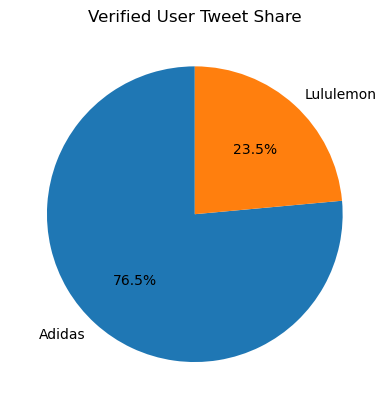

In [112]:
# Pie chart by brand
verified_counts = df[df['user.verified'] == True]['brand'].value_counts()

verified_counts.plot(kind='pie', autopct='%1.1f%%', startangle=90, title='Verified User Tweet Share')
plt.ylabel('')
plt.show()

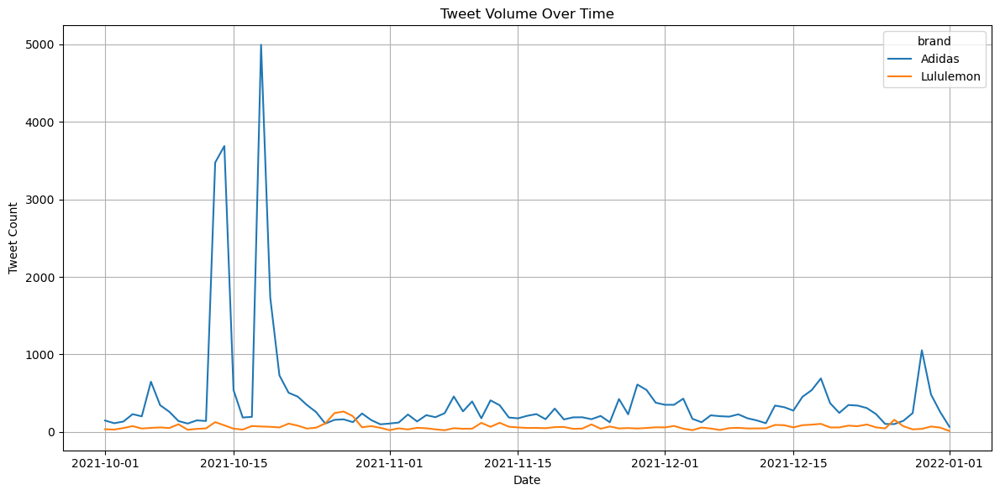

In [113]:
# Count tweets per date per brand
daily_counts = df.groupby(['date', 'brand']).size().unstack().fillna(0)

# Plot
daily_counts.plot(figsize=(12,6), title='Tweet Volume Over Time')
plt.xlabel('Date')
plt.ylabel('Tweet Count')
plt.grid(True)
plt.tight_layout()
plt.show()

Adidas shows sharp tweet spikes in mid-October, peaking near 5,000 tweets, indicating event-driven engagement; Lululemon maintains steady, low-volume activity.
Sentiment distributions for both brands are right-skewed, with Adidas showing more polarity extremes, suggesting stronger emotional reactions.
The average sentiment is mildly positive (0.175), with most tweets near-neutral.
Verified users contribute 76.5% of Adidas tweets versus 23.5% for Lululemon, indicating stronger brand engagement from notable users.
Subjectivity scores help distinguish personal opinions from factual content, enriching interpretation of sentiment polarity.

## B) Location Tweet Analysis:

In [114]:
# Lowercase all locations to standardize
df['user.location'] = df['user.location'].str.lower()

# Count null and unique locations
print("Missing locations:", df['user.location'].isna().sum())
print("Unique locations:", df['user.location'].nunique())

# Top 10 most common locations
top_locations = df['user.location'].value_counts().head(10)
print("\nTop 10 locations:\n", top_locations)

Missing locations: 0
Unique locations: 10126

Top 10 locations:
 user.location
unknown            12143
united states       1288
chicago, il          533
california, usa      519
los angeles, ca      474
new york, ny         470
miami, fl            424
usa                  357
new york, usa        323
florida, usa         288
Name: count, dtype: int64


In [115]:
# Define reference lists
us_states = [
    "alabama", "alaska", "arizona", "arkansas", "california", "colorado", "connecticut", "delaware", "florida", "georgia", 
    "hawaii", "idaho", "illinois", "indiana", "iowa", "kansas", "kentucky", "louisiana", "maine", "maryland", "massachusetts", 
    "michigan", "minnesota", "mississippi", "missouri", "montana", "nebraska", "nevada", "new hampshire", "new jersey", "new mexico", 
    "new york", "north carolina", "north dakota", "ohio", "oklahoma", "oregon", "pennsylvania", "rhode island", "south carolina", "south dakota", 
    "tennessee", "texas", "utah", "vermont", "virginia", "washington", "west virginia", "wisconsin", "wyoming"
]

uk_cities = [
    "london", "manchester", "birmingham", "glasgow", "liverpool", "edinburgh", "bristol", "leeds", "newcastle", "sheffield",
    "cardiff", "belfast", "nottingham", "southampton", "brighton", "portsmouth", "aberdeen", "leicester", "coventry", "oxford"
]

popular_cities_usa = [
    "new york", "los angeles", "chicago", "houston", "phoenix", "philadelphia", "san antonio", "san diego", "dallas", "san jose",
    "austin", "jacksonville", "san francisco", "columbus", "indianapolis", "fort worth", "charlotte", "seattle", "denver", "washington"
]

south_america_countries = ['argentina', 'bolivia', 'brazil', 'chile', 'colombia', 'ecuador', 'guyana', 'paraguay', 'peru', 'suriname', 'uruguay', 'venezuela']


In [116]:
# Function to map location to country
def extract_country(location):
    if pd.isna(location):
        return 'Unknown'
    if any(x in location for x in ['usa', 'united states']) or \
       any(state in location for state in us_states) or \
       any(city in location for city in popular_cities_usa):
        return 'USA'
    elif any(x in location for x in ['uk', 'united kingdom', 'england']) or \
         any(city in location for city in uk_cities):
        return 'UK'
    elif 'canada' in location:
        return 'Canada'
    elif 'india' in location:
        return 'India'
    elif 'australia' in location:
        return 'Australia'
    elif 'germany' in location:
        return 'Germany'
    elif 'spain' in location or 'madrid' in location or 'barcelona' in location:
        return 'Spain'
    elif any(country in location for country in south_america_countries):
        return 'South America'
    else:
        return 'Other'

# Apply function to location column
df['country'] = df['user.location'].apply(extract_country)


Tweet counts by country:
 country
Other            29291
USA              14527
UK                 541
Canada               7
Germany              3
India                3
South America        3
Spain                3
Australia            2
Name: count, dtype: int64


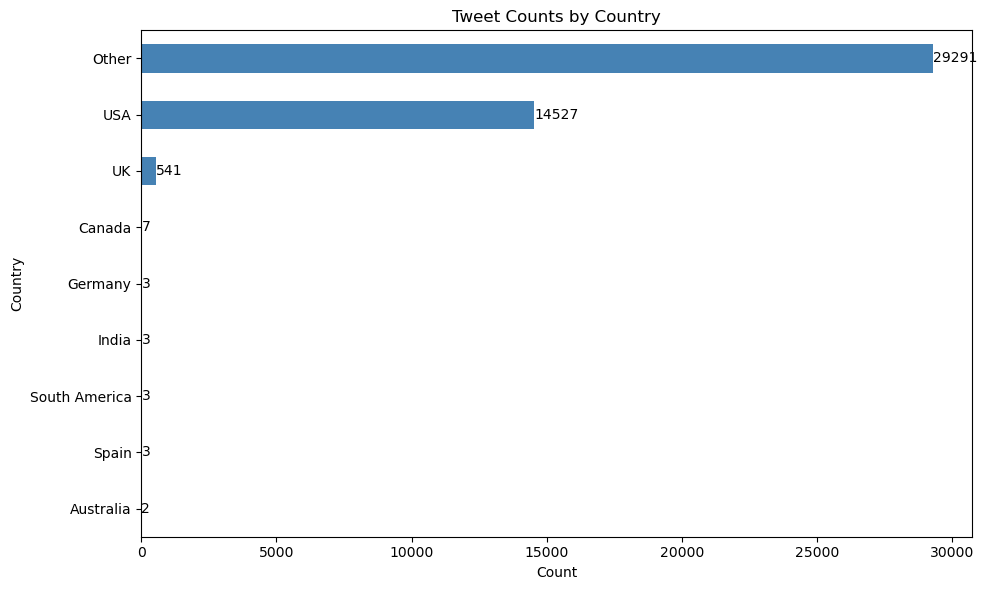

In [117]:
# Country count
country_counts = df['country'].value_counts()
print("\nTweet counts by country:\n", country_counts)

# Visualize
plt.figure(figsize=(10,6))
country_counts.plot(kind='barh', color='steelblue')
plt.title("Tweet Counts by Country")
plt.xlabel("Count")
plt.ylabel("Country")
plt.gca().invert_yaxis()
for i, v in enumerate(country_counts):
    plt.text(v + 5, i, str(v), va='center')
plt.tight_layout()
plt.show()

In [118]:
# Look at top 50 "Other" locations
df[df['country'] == 'Other']['user.location'].value_counts().head(50)

user.location
unknown                     12143
miami, fl                     424
atlanta, ga                   201
las vegas, nv                 192
brooklyn, ny                  178
boston, ma                    157
tampa, fl                     149
metaverse                     141
nashville, tn                  97
nyc                            83
minneapolis, mn                74
portland, or                   72
pleasant prairie, wi           70
earth                          68
mazatlán, sinaloa              67
louisville, ky                 67
orlando, fl                    60
pittsburgh, pa                 56
salt lake city, ut             55
buffalo, ny                    53
cincinnati, oh                 52
new orleans, la                50
long beach, ca                 50
cleveland, oh                  49
detroit, mi                    47
baton rouge, la                45
everywhere                     44
boston                         44
baltimore, md                  41


In [119]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [120]:
import plotly.express as px
# Step 1: Group by country and count tweets
country_counts = df['country'].value_counts().reset_index()
country_counts.columns = ['country', 'tweet_count']

In [121]:
# Example df_country_counts should already be like this:
# df_country_counts = pd.DataFrame({'country': [...], 'tweet_count': [...]})

# Apply log transformation to smooth out extreme differences
country_counts['log_tweet_count'] = np.log1p(country_counts['tweet_count'])  # log(1 + x) to avoid log(0)

fig = px.choropleth(
    country_counts,
    locations="country",
    locationmode="country names",
    color="log_tweet_count",
    hover_name="country",
    color_continuous_scale="Blues",
    title="Tweet Count by Country (Log Scale)"
)

fig.show()


C:\Users\Samiksha\anaconda3\lib\site-packages\plotly\io\_renderers.py:55: UserWarning:

Plotly version >= 6 requires Jupyter Notebook >= 7 but you have 6.5.2 installed.
 To upgrade Jupyter Notebook, please run `pip install notebook --upgrade`.



Log scale → great for visualizing wide range values

The majority of tweets originate from the USA (14,527), followed by the UK (541), with the rest grouped under “Other” (29,291), indicating significant geographic diversity and non-standardized location data.
Over 12,000 users listed their location as "unknown," emphasizing the need for robust geographic data cleaning and classification.
Top U.S. cities include Miami, Atlanta, and Las Vegas, while some entries like "metaverse" or "earth" reflect playful or non-geographic inputs.
The log-scaled world map visualization highlights the dominance of North America and the UK in tweet volume, with minimal representation from other regions.
A custom mapping function was used to classify noisy text inputs into countries, enabling clearer aggregation and comparative regional insights.



## C) Twitter User Behavior Analysis:

In [122]:
# Check locations with non-alphabet characters (for cleanup insight)
non_alpha = df[df['user.location'].str.contains(r'[^a-zA-Z,\s]', na=False)]
print("\nNumber of non-alphanumeric location entries:", non_alpha['user.location'].nunique())


Number of non-alphanumeric location entries: 2992


In [123]:
# Most followed user per brand
most_followed_per_brand = df.loc[df.groupby('brand')['user.followers_count'].idxmax()][['brand', 'user.id', 'user.followers_count', 'user.verified', 'full_text']]
print("Most Followed User Per Brand:\n")
print(most_followed_per_brand)

Most Followed User Per Brand:

           brand   user.id  user.followers_count  user.verified  \
34682     Adidas  24742040              17391710           True   
42186  Lululemon  15754281               4518955           True   

                                                                                                                                    full_text  
34682  Next-gen gaming meets next-gen style.  Get the @adidas Xbox Forum Tech Boost: https://t.co/GJ18yg1MBz  #Xbox20 https://t.co/mrUtao1xy4  
42186                                           RT @reviewed: The rarest deal sighting of them all—a @lululemon sale! https://t.co/oY7BbCe8PI  


In [124]:
# Most retweeted tweet per brand
most_retweeted_per_brand = df.loc[df.groupby('brand')['retweet_count'].idxmax()][['brand', 'user.id', 'retweet_count', 'full_text', 'sentiment']]
print("Most Retweeted Tweet Per Brand:\n")
print(most_retweeted_per_brand)

Most Retweeted Tweet Per Brand:

           brand     user.id  retweet_count  \
10819     Adidas    24742040          19396   
39046  Lululemon  1709834424           1791   

                                                                                                                                                                                                                                                                                                     full_text  \
10819  Three icons: @adidas, Xbox, and you.  Follow & RT with #XboxSweepstakes for a chance to win this exclusive kit including the Xbox 20th Forum Tech shoe, a custom Xbox Series X, and the next-generation @Hyperkin Duke  Ends 10/23/21. Rules: https://t.co/0iKPYTlhJe | #Xbox20 https://t.co/7ytiTAtqXM   
39046                                                                                                                                                                                                                

In [125]:
# Most favourited tweet per brand
most_favourited_per_brand = df.loc[df.groupby('brand')['favorite_count'].idxmax()][['brand', 'user.id', 'favorite_count', 'full_text', 'sentiment']]
print("Most Favourited Tweet Per Brand:\n")
print(most_favourited_per_brand)

Most Favourited Tweet Per Brand:

           brand    user.id  favorite_count  \
10819     Adidas   24742040           21965   
41760  Lululemon  199399909            1033   

                                                                                                                                                                                                                                                                                                     full_text  \
10819  Three icons: @adidas, Xbox, and you.  Follow & RT with #XboxSweepstakes for a chance to win this exclusive kit including the Xbox 20th Forum Tech shoe, a custom Xbox Series X, and the next-generation @Hyperkin Duke  Ends 10/23/21. Rules: https://t.co/0iKPYTlhJe | #Xbox20 https://t.co/7ytiTAtqXM   
41760                                                                            Irony: I just left @lululemon where their employees are referred to as “educators,” two of the salespeople who helped me were actua

In [126]:
df['influence_score'] = df['retweet_count'] + df['favorite_count']

top_influential_per_brand = df.sort_values('influence_score', ascending=False).groupby('brand').head(5)
print("Top 5 Influential Tweets Per Brand:\n")
display(top_influential_per_brand[['brand', 'user.id', 'influence_score', 'full_text', 'sentiment']])

Top 5 Influential Tweets Per Brand:



,brand,user.id,influence_score,full_text,sentiment
10819,Adidas,24742040,41361,"Three icons: @adidas, Xbox, and you. Follow & RT with #XboxSweepstakes for a chance to win this exclusive kit including the Xbox 20th Forum Tech shoe, a custom Xbox Series X, and the next-generation @Hyperkin Duke Ends 10/23/21. Rules: https://t.co/0iKPYTlhJe | #Xbox20 https://t.co/7ytiTAtqXM",0.800000
15573,Adidas,824200700,19396,"RT @Xbox: Three icons: @adidas, Xbox, and you. Follow & RT with #XboxSweepstakes for a chance to win this exclusive kit including the Xbox…",0.800000
13267,Adidas,985003196274835500,19396,"RT @Xbox: Three icons: @adidas, Xbox, and you. Follow & RT with #XboxSweepstakes for a chance to win this exclusive kit including the Xbox…",0.800000
13256,Adidas,34377274,19396,"RT @Xbox: Three icons: @adidas, Xbox, and you. Follow & RT with #XboxSweepstakes for a chance to win this exclusive kit including the Xbox…",0.800000
13257,Adidas,406579772,19396,"RT @Xbox: Three icons: @adidas, Xbox, and you. Follow & RT with #XboxSweepstakes for a chance to win this exclusive kit including the Xbox…",0.800000
39046,Lululemon,1709834424,1791,"RT @lululemon: It's always ""wyd"" never ""what do you want from lululemon?""",0.000000
41760,Lululemon,199399909,1106,"Irony: I just left @lululemon where their employees are referred to as “educators,” two of the salespeople who helped me were actually teachers (working their 2nd job) and yet they don’t offer actual educators a discount.",0.000000
40041,Lululemon,27947088,626,John Tavares helped unveil the new @TeamCanada @lululemon athlete kits for the Beijing Olympics 🇨🇦 More: https://t.co/J7vRbj5yev https://t.co/FyHb9C9Ioe,0.136364
38926,Lululemon,867328046,606,RT @wildingpaulaa: .@lululemon I went to your store and was told that I do not qualify for the Healthcare discount after presenting my hosp…,0.000000
39318,Lululemon,3287724061,484,Trying to enjoy one of the last perfect days of the year doing what I love! @lululemon @nike #teamsteele #golf #lindasteelehotbod #mentalhealth #positivevibes https://t.co/myOwQ9c3xP,0.475000


In [127]:
verified_users = df[df['user.verified'] == True]

most_active_verified = verified_users.groupby(['brand', 'user.id']).size().reset_index(name='tweet_count')
top_verified_per_brand = most_active_verified.sort_values('tweet_count', ascending=False).groupby('brand').head(5)

print("Top Verified Users Per Brand by Tweet Count:\n")
print(top_verified_per_brand)

Top Verified Users Per Brand by Tweet Count:

         brand     user.id  tweet_count
109     Adidas    21436676           33
289     Adidas   185909682           21
355     Adidas   361329018           19
76      Adidas    18470958           17
29      Adidas    14290427           16
686  Lululemon  1629244514           14
660  Lululemon   388521075            7
646  Lululemon   282248749            6
654  Lululemon   332437933            6
589  Lululemon    38237330            6


In [128]:
top_users = df.groupby(['brand', 'user.id']).size().reset_index(name='tweet_count')
top_10_users_per_brand = top_users.sort_values('tweet_count', ascending=False).groupby('brand').head(10)

print("Top 10 Users by Tweet Count Per Brand:\n")
print(top_10_users_per_brand)

Top 10 Users by Tweet Count Per Brand:

           brand              user.id  tweet_count
10568     Adidas            281283506          137
14482     Adidas            458036949          127
1708      Adidas             24852153          108
26969     Adidas  1086436967204700200           89
22551     Adidas           2347802995           68
20879     Adidas           1649250498           68
18873     Adidas           1077992828           67
11922     Adidas            337649347           53
27441     Adidas  1203845225967444000           39
5972      Adidas             95986221           35
30733  Lululemon            215522693           32
29568  Lululemon             24038731           31
33571  Lululemon  1433123168126963700           24
30487  Lululemon            145758982           23
32767  Lululemon           2435986713           20
33177  Lululemon   881548979682422800           20
33002  Lululemon           4527461435           16
33024  Lululemon           4924926322     

In [211]:
# Update these if brand handles differ
brand_handles = {
    'Adidas': ['@adidas', '@adidasoriginals', '@adidasus'],
    'Lululemon': ['@lululemon']
}

# Create a mask for each brand
tagged_dfs = []
for brand, handles in brand_handles.items():
    pattern = '|'.join(handles)
    tagged = df[(df['brand'] == brand) & (df['full_text'].str.contains(pattern, case=False, na=False))]
    tagged_dfs.append(tagged)

# Combine
tagged_tweets = pd.concat(tagged_dfs)
print("Tweets mentioning the brands (tagged):", len(tagged_tweets))
display(tagged_tweets[['brand', 'user.id', 'full_text']].head(5))

Tweets mentioning the brands (tagged): 44003


,brand,user.id,full_text
0,Adidas,723347581586255900,@_christiankeith @d1vetsam @KicksFinder They a...
1,Adidas,281283506,SELENA boosted up Puma stocks by 40% Her part...
2,Adidas,492598592,RT @R_Riakporhe: It’s been a real struggle to ...
3,Adidas,259097925,@adidasUS @adidasoriginals looks like this pro...
4,Adidas,342395526,@NateRuns5 @d1vetsam @KicksFinder @adidas Stil...


Around 2,992 user locations contain non-alphabetic characters, highlighting noise in self-reported location data.
The most followed users per brand are verified influencers with over 17 million (Adidas) and 4.5 million (Lululemon) followers, reflecting high-profile endorsements.
Adidas had the most retweeted and favorited tweet (over 19K retweets, 21K likes), centered around a collaboration with Xbox, yielding a top influence score of 41,361.
The top verified Adidas user posted 33 tweets, while the top Lululemon verified user posted 14, showing greater verified user activity for Adidas.
In total, 44,003 tweets explicitly mention brand handles, emphasizing strong direct brand tagging and community engagement, especially around Adidas.

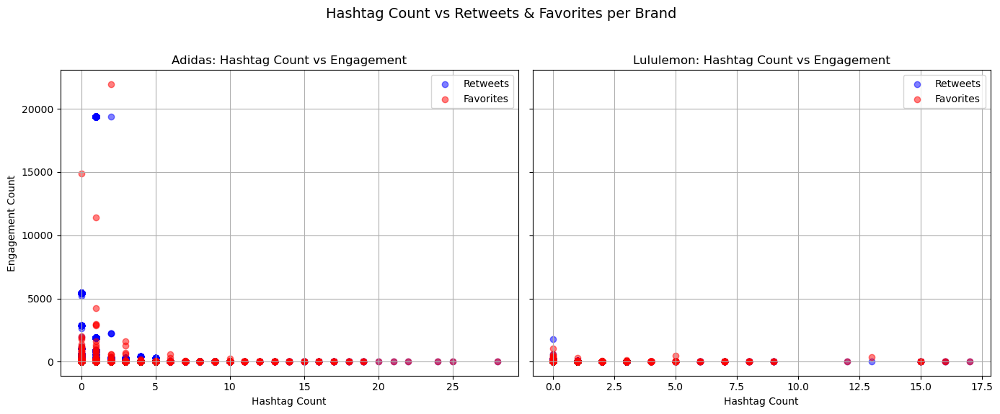

In [212]:
# Filter data for each brand
adidas_df = df[df['brand'] == 'Adidas']
lululemon_df = df[df['brand'] == 'Lululemon']

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6), sharey=True)

# Adidas Plot
axes[0].scatter(adidas_df['hashtag_count'], adidas_df['retweet_count'], color='blue', label='Retweets', alpha=0.5)
axes[0].scatter(adidas_df['hashtag_count'], adidas_df['favorite_count'], color='red', label='Favorites', alpha=0.5)
axes[0].set_title('Adidas: Hashtag Count vs Engagement')
axes[0].set_xlabel('Hashtag Count')
axes[0].set_ylabel('Engagement Count')
axes[0].legend()
axes[0].grid(True)

# Lululemon Plot
axes[1].scatter(lululemon_df['hashtag_count'], lululemon_df['retweet_count'], color='blue', label='Retweets', alpha=0.5)
axes[1].scatter(lululemon_df['hashtag_count'], lululemon_df['favorite_count'], color='red', label='Favorites', alpha=0.5)
axes[1].set_title('Lululemon: Hashtag Count vs Engagement')
axes[1].set_xlabel('Hashtag Count')
axes[1].legend()
axes[1].grid(True)

# Layout
plt.suptitle('Hashtag Count vs Retweets & Favorites per Brand', fontsize=14)
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [129]:
# Function to extract top hashtags per brand
def get_top_hashtags_by_brand(df, brand_name):
    brand_df = df[df['brand'] == brand_name]
    brand_df['hashtags_extracted'] = brand_df['full_text'].str.findall(r'#\w+')
    hashtags = list(chain(*brand_df['hashtags_extracted']))
    hashtag_counts = Counter([tag.lower() for tag in hashtags])
    return hashtag_counts.most_common(10)

# Top hashtags for Adidas
print("Top 10 Hashtags for Adidas:")
adidas_top_tags = get_top_hashtags_by_brand(df, 'Adidas')
for tag, count in adidas_top_tags:
    print(f"{tag}: {count} times")

print("\n" + "="*50 + "\n")

# Top hashtags for Lululemon
print("Top 10 Hashtags for Lululemon:")
lululemon_top_tags = get_top_hashtags_by_brand(df, 'Lululemon')
for tag, count in lululemon_top_tags:
    print(f"{tag}: {count} times")


Top 10 Hashtags for Adidas:
#xboxsweepstakes: 7147 times
#impossibleisnothing: 1168 times
#adidas: 694 times
#xbox20: 482 times
#giveaway: 410 times
#running: 405 times
#runningshoes: 399 times
#nft: 178 times
#boltup: 169 times
#metaverse: 163 times


Top 10 Hashtags for Lululemon:
#thesweatlife: 113 times
#lululemoncoalprit: 71 times
#12daysofcheckout: 67 times
#fossilfreefashion: 65 times
#lululemon: 64 times
#coalsweats: 61 times
#teamcanada: 44 times
#yoga: 33 times
#fitness: 19 times
#beijing2022: 18 times


C:\Users\Samiksha\AppData\Local\Temp\ipykernel_38712\2351683219.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Samiksha\AppData\Local\Temp\ipykernel_38712\2351683219.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Adidas shows significantly higher engagement with tweets containing up to 3 hashtags, especially around campaign tags like #xboxsweepstakes, which was used over 7,000 times.
Lululemon's hashtag use is more modest, with top tags like #thesweatlife and #fossilfreefashion used under 120 times, reflecting more targeted and niche marketing.Hashtag count, word count, and sentiment show moderate positive correlations with engagement metrics for Adidas, but weaker or inconsistent trends for Lululemon.
Overall, hashtag use appears to enhance visibility and interaction for Adidas far more than Lululemon, aligning with broader campaign-driven strategies.

# Section 3
# Sentimental Analysis:

Sentiment analysis is performed to evaluate the emotional tone of user tweets, categorizing them as positive, neutral, or negative.
This helps uncover public perception and brand sentiment trends over time, guiding insights into audience engagement and brand reputation.

In [130]:
import pandas as pd
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# Download VADER lexicon
nltk.download('vader_lexicon')

# Initialize VADER analyzer
sid = SentimentIntensityAnalyzer()

# Step 1: Apply VADER and store compound score as sentiment_score
df['sentiment_score'] = df['clean_text'].apply(lambda x: sid.polarity_scores(x)['compound'])

# Step 2: Convert score into sentiment labels
def classify_sentiment(score):
    if score >= 0.05:
        return 'Positive'
    elif score <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Samiksha\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [131]:
df['sentiment_label'] = df['sentiment_score'].apply(classify_sentiment)

# Step 3: View sentiment distribution
print("Sentiment Counts:")
print(df['sentiment_label'].value_counts())

print("\nSentiment by Brand:")
print(df.groupby('brand')['sentiment_label'].value_counts(normalize=True).unstack().round(2))

Sentiment Counts:
sentiment_label
Positive    21026
Neutral     18417
Negative     4937
Name: count, dtype: int64

Sentiment by Brand:
sentiment_label  Negative  Neutral  Positive
brand                                       
Adidas               0.11     0.43      0.47
Lululemon            0.15     0.34      0.51


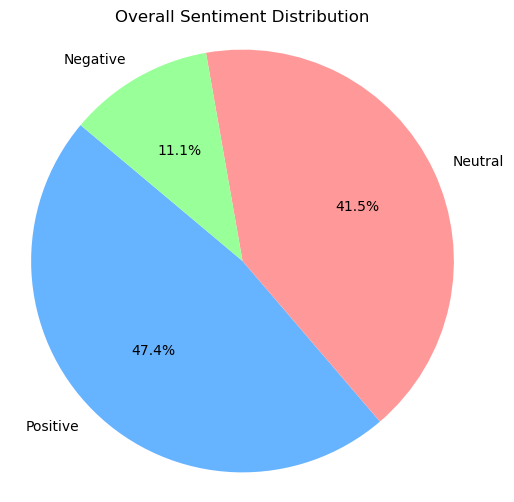

In [132]:
sentiment_counts = df['sentiment_label'].value_counts()
colors = ['#66b3ff', '#ff9999', '#99ff99']  # Neutral, Negative, Positive
plt.figure(figsize=(6, 6))
plt.pie(sentiment_counts, labels=sentiment_counts.index, autopct='%1.1f%%', colors=colors, startangle=140)
plt.title("Overall Sentiment Distribution")
plt.axis('equal')
plt.show()

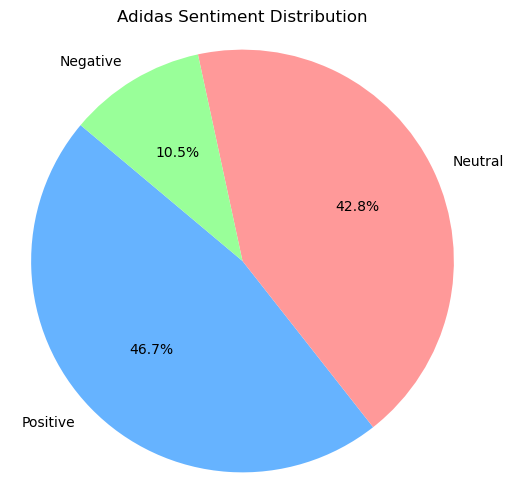

In [133]:
# Filter the data for Adidas
adidas_data = df[df['brand'] == 'Adidas']

# Count sentiment occurrences for Adidas
sentiment_counts_adidas = adidas_data['sentiment_label'].value_counts()

# Colors for Neutral, Negative, and Positive
colors = ['#66b3ff', '#ff9999', '#99ff99']  # Neutral, Negative, Positive

# Plot the pie chart for Adidas sentiment distribution
plt.figure(figsize=(6, 6))
plt.pie(sentiment_counts_adidas, 
        labels=sentiment_counts_adidas.index, 
        autopct='%1.1f%%', 
        colors=colors, 
        startangle=140)

plt.title('Adidas Sentiment Distribution')
plt.axis('equal')  # Equal aspect ratio to ensure the pie is circular
plt.show()

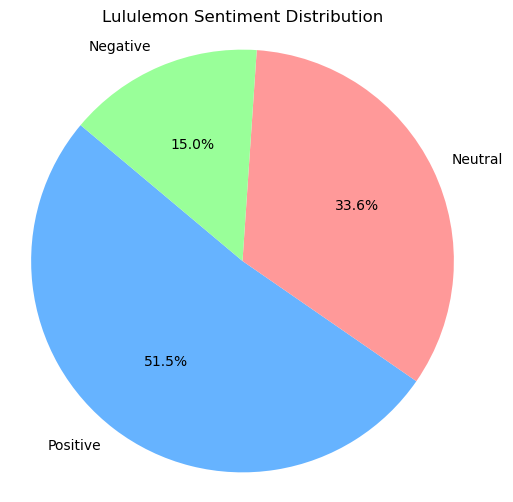

In [134]:
# Filter the data for Lululemon
lululemon_data = df[df['brand'] == 'Lululemon']

# Count sentiment occurrences for Lululemon
sentiment_counts_lululemon = lululemon_data['sentiment_label'].value_counts()

# Colors for Neutral, Negative, and Positive
colors = ['#66b3ff', '#ff9999', '#99ff99']  # Neutral, Negative, Positive

# Plot the pie chart for Lululemon sentiment distribution
plt.figure(figsize=(6, 6))
plt.pie(sentiment_counts_lululemon, 
        labels=sentiment_counts_lululemon.index, 
        autopct='%1.1f%%', 
        colors=colors, 
        startangle=140)

plt.title('Lululemon Sentiment Distribution')
plt.axis('equal')  # Equal aspect ratio to ensure the pie is circular
plt.show()

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning:

use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.



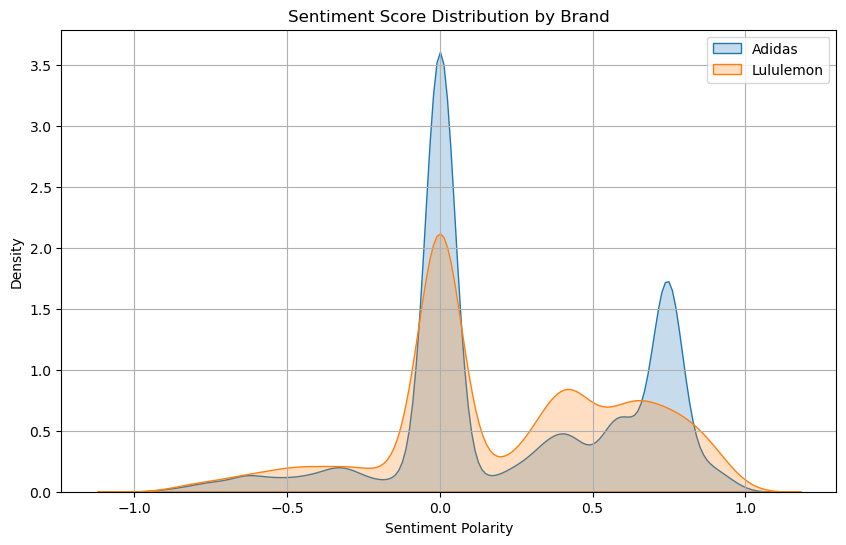

In [135]:
plt.figure(figsize=(10, 6))
sns.kdeplot(df[df['brand'] == 'Adidas']['sentiment_score'], label='Adidas', fill=True)
sns.kdeplot(df[df['brand'] == 'Lululemon']['sentiment_score'], label='Lululemon', fill=True)
plt.title('Sentiment Score Distribution by Brand')
plt.xlabel('Sentiment Polarity')
plt.legend()
plt.grid(True)
plt.show()

Adidas shows broader emotional variation with a notable peak in highly positive sentiment, while Lululemon maintains a more consistently neutral tone.

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is

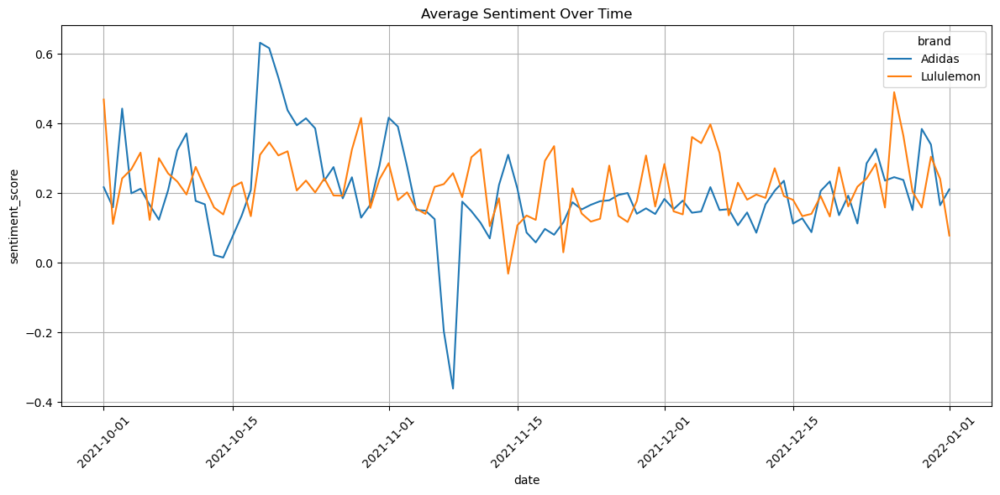

In [136]:
# Group by date & brand
sentiment_trend = df.groupby(['date', 'brand'])['sentiment_score'].mean().reset_index()

plt.figure(figsize=(12,6))
sns.lineplot(data=sentiment_trend, x='date', y='sentiment_score', hue='brand')
plt.title('Average Sentiment Over Time')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()

Adidas sentiment fluctuates more over time with sharper spikes, while Lululemon maintains steadier, moderate sentiment trends across the same period.

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



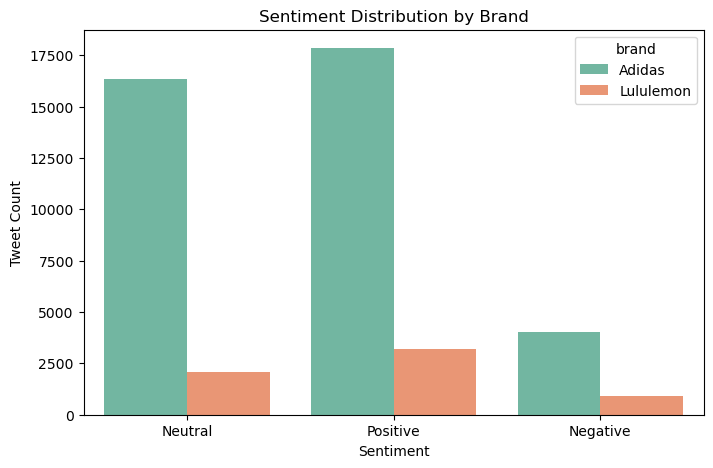

In [137]:
plt.figure(figsize=(8,5))
sns.countplot(data=df, x='sentiment_label', hue='brand', palette='Set2')
plt.title('Sentiment Distribution by Brand')
plt.ylabel('Tweet Count')
plt.xlabel('Sentiment')
plt.show()

Adidas has a higher volume of tweets across all sentiment categories, especially neutral and positive, while Lululemon has fewer tweets overall with a similar sentiment distribution pattern.


In [138]:
# Group by brand, verification status, and sentiment
verified_sentiment_per_brand = df.groupby(['brand', 'user.verified', 'sentiment_label']).size().unstack(fill_value=0)

# Display the result
print("Sentiment by Verified Status per Brand:\n")
print(verified_sentiment_per_brand)

Sentiment by Verified Status per Brand:

sentiment_label          Negative  Neutral  Positive
brand     user.verified                             
Adidas    False              3928    15956     17340
          True                 86      391       510
Lululemon False               904     1962      2999
          True                 19      108       177


C:\Users\Samiksha\AppData\Local\Temp\ipykernel_38712\3956131665.py:9: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use

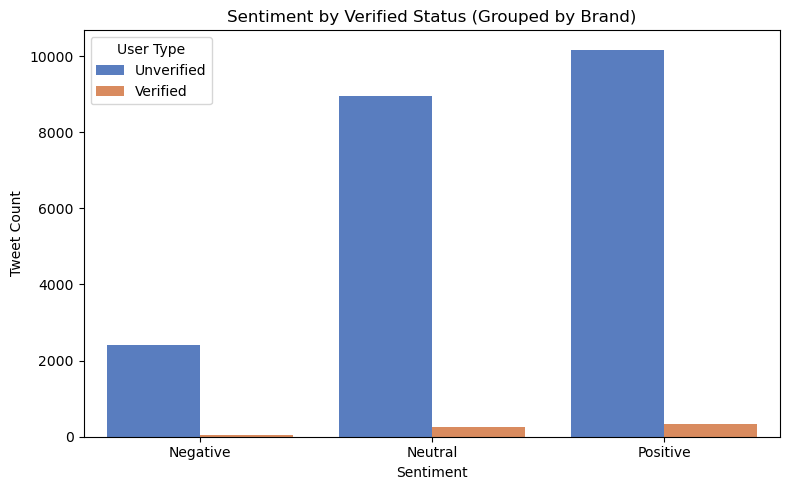

In [139]:
# Prepare the data
verified_sentiment = df.groupby(['brand', 'user.verified', 'sentiment_label']).size().reset_index(name='count')

# Map boolean to string for better legends
verified_sentiment['user.verified'] = verified_sentiment['user.verified'].map({True: 'Verified', False: 'Unverified'})

# Plot
plt.figure(figsize=(8, 5))
sns.barplot(
    data=verified_sentiment,
    x='sentiment_label',
    y='count',
    hue='user.verified',
    palette='muted',
    ci=None
)

plt.title('Sentiment by Verified Status (Grouped by Brand)')
plt.xlabel('Sentiment')
plt.ylabel('Tweet Count')
plt.legend(title='User Type')
plt.tight_layout()
plt.show()

Unverified users contribute the vast majority of tweets across all sentiment types, while verified users show a slight preference for neutral and positive sentiment but remain a small portion overall.


In [140]:
# Create follower groups based on median follower count
median_followers = df['user.followers_count'].median()
df['follower_group'] = df['user.followers_count'].apply(lambda x: 'High' if x >= median_followers else 'Low')

# Group by brand, follower group, and sentiment
follower_sentiment_per_brand = df.groupby(['brand', 'follower_group', 'sentiment_label']).size().unstack(fill_value=0)

# Display results
print("Sentiment by Follower Group per Brand:\n")
print(follower_sentiment_per_brand)

Sentiment by Follower Group per Brand:

sentiment_label           Negative  Neutral  Positive
brand     follower_group                             
Adidas    High                2195     8176      8304
          Low                 1819     8171      9546
Lululemon High                 454     1195      1901
          Low                  469      875      1275


C:\Users\Samiksha\AppData\Local\Temp\ipykernel_38712\3549323617.py:11: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.


C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Us

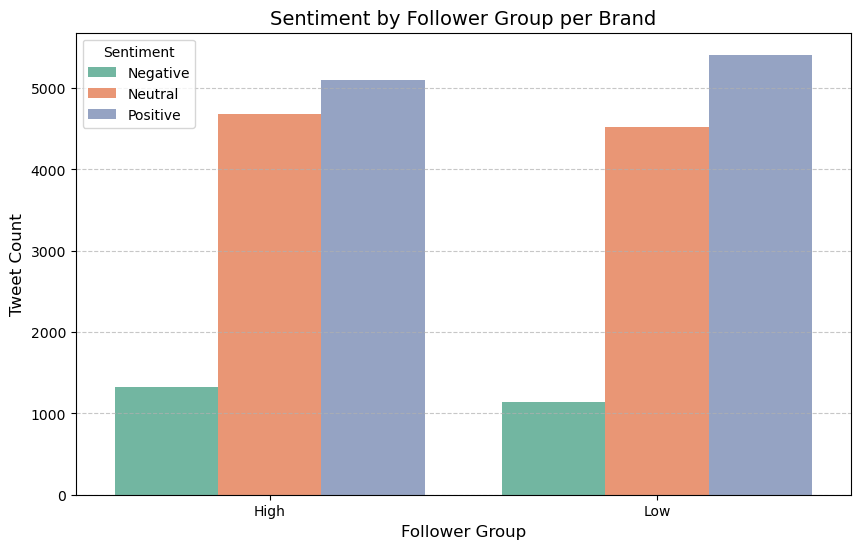

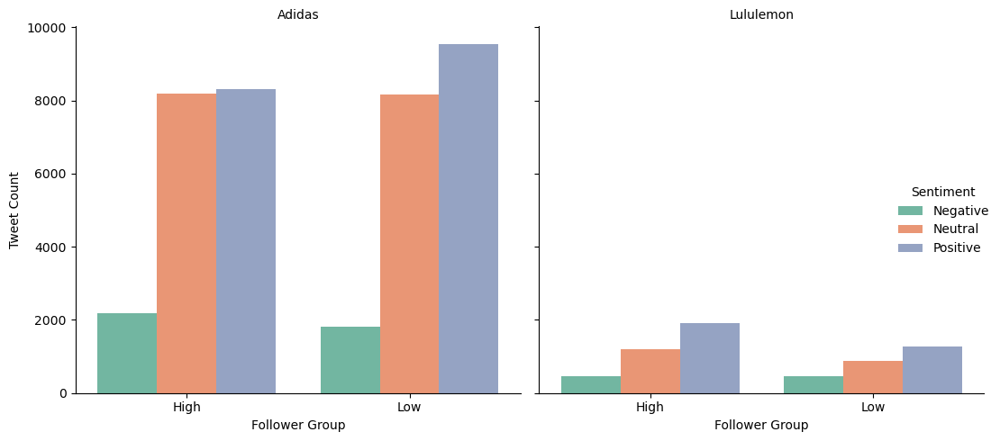

In [141]:
# Reset index for Seaborn compatibility
plot_data = follower_sentiment_per_brand.reset_index().melt(
    id_vars=['brand', 'follower_group'],
    value_vars=['Negative', 'Neutral', 'Positive'],
    var_name='Sentiment',
    value_name='Count'
)

# Plot with seaborn
plt.figure(figsize=(10, 6))
sns.barplot(
    data=plot_data,
    x='follower_group',
    y='Count',
    hue='Sentiment',
    palette='Set2',
    ci=None,
    dodge=True
)

# Add titles and labels
plt.title('Sentiment by Follower Group per Brand', fontsize=14)
plt.xlabel('Follower Group', fontsize=12)
plt.ylabel('Tweet Count', fontsize=12)
plt.legend(title='Sentiment')
plt.grid(axis='y', linestyle='--', alpha=0.7)

# Separate by brand using FacetGrid
g = sns.catplot(
    data=plot_data,
    x='follower_group', y='Count',
    hue='Sentiment', col='brand',
    kind='bar', height=5, aspect=1,
    palette='Set2'
)
g.set_titles("{col_name}")
g.set_axis_labels("Follower Group", "Tweet Count")
g._legend.set_title("Sentiment")
plt.tight_layout()
plt.show()

In [142]:
# Group by brand, tweet type, and sentiment label
tweet_type_sentiment_per_brand = df.groupby(['brand', 'tweet_type', 'sentiment_label']).size().unstack(fill_value=0)

# Display the result
print("Sentiment by Tweet Type per Brand:\n")
print(tweet_type_sentiment_per_brand)

Sentiment by Tweet Type per Brand:

sentiment_label       Negative  Neutral  Positive
brand     tweet_type                             
Adidas    Original        2433    13361      7202
          Quote            216      372       483
          Retweet         1365     2614     10165
Lululemon Original         748     1610      2302
          Quote             26       58        72
          Retweet          149      402       802


C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is

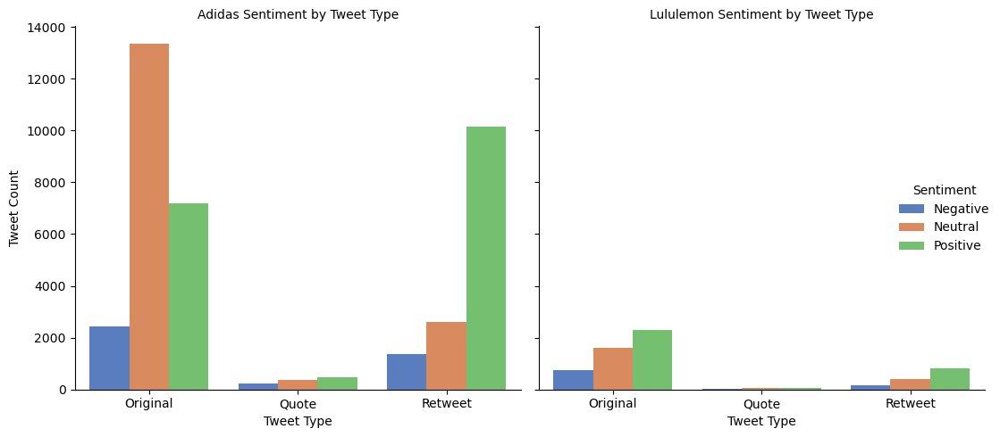

In [143]:
# Prepare data for plotting
plot_data = df.groupby(['brand', 'tweet_type', 'sentiment_label']).size().reset_index(name='count')

# Set up the FacetGrid
g = sns.catplot(
    data=plot_data,
    x='tweet_type', y='count', hue='sentiment_label',
    col='brand',
    kind='bar',
    height=5, aspect=1,
    palette='muted'
)

# Enhance the plot
g.set_axis_labels("Tweet Type", "Tweet Count")
g.set_titles("{col_name} Sentiment by Tweet Type")
g._legend.set_title("Sentiment")
plt.tight_layout()
plt.show()

In [144]:
# Top 5 most positive tweets per brand
top_positive = df[df['sentiment_label'] == 'Positive']\
    .sort_values(by='sentiment_score', ascending=False)\
    .groupby('brand').head(5)[['brand', 'sentiment_score', 'full_text']]

print("\nTop 5 Positive Tweets by Brand:")
print(top_positive.to_string(index=False))


Top 5 Positive Tweets by Brand:
    brand  sentiment_score                                                                                                                                                                                                                                                                                                                                    full_text
   Adidas           0.9890                                                 @adidas @adidasUS @XSchauffele Dear Adidas!! I love Jay-Z ;I love Beyonce !I love Carters ! I love Travis Scott ! I love Drake !! I Love Pharrell Williams ! They improve my life. Now and forever......I love you ! https://t.co/UiuDcHlR7O https://t.co/OGILj4VrpP https://t.co/uiWGwPnk2t
   Adidas           0.9890                                                @adidas @adidasUS @Dame_Lillard Dear Adidas!! I love Jay-Z ;I love Beyonce !I love Carters ! I love Travis Scott ! I love Drake !! I Love Pharrell Williams ! They improve my

In [145]:
# Top 5 most negative tweets per brand
top_negative = df[df['sentiment_label'] == 'Negative']\
    .sort_values(by='sentiment_score')\
    .groupby('brand').head(5)[['brand', 'sentiment_score', 'full_text']]
print("\nTop 5 Negative Tweets by Brand:")
print(top_negative.to_string(index=False))


Top 5 Negative Tweets by Brand:
    brand  sentiment_score                                                                                                                                                                                                                                                                                                     full_text
   Adidas          -0.9764                                                                Customer service has been PISS POOR. No resolution. Just blaming the customer for their faulty business dealings and bad partnerships! @FedEx is literally the worst courier and @adidas blames the customers for fedex issues! I’m so pissed!
   Adidas          -0.9703  @StateFarm @adidas your silence is deafening @AaronRodgers12 lied to his teammates, nfl staff & didn’t follow safety measures his irresponsible lying could have had life threatening consequences! Time for him to go @GreenbaypackNFL what a disgrace, very very bad sportsmanship http

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead

C:\Users\Samiksha\anaconda3\lib\site-packages\seaborn\_oldcore.py:1498: DeprecationWarning:

is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead



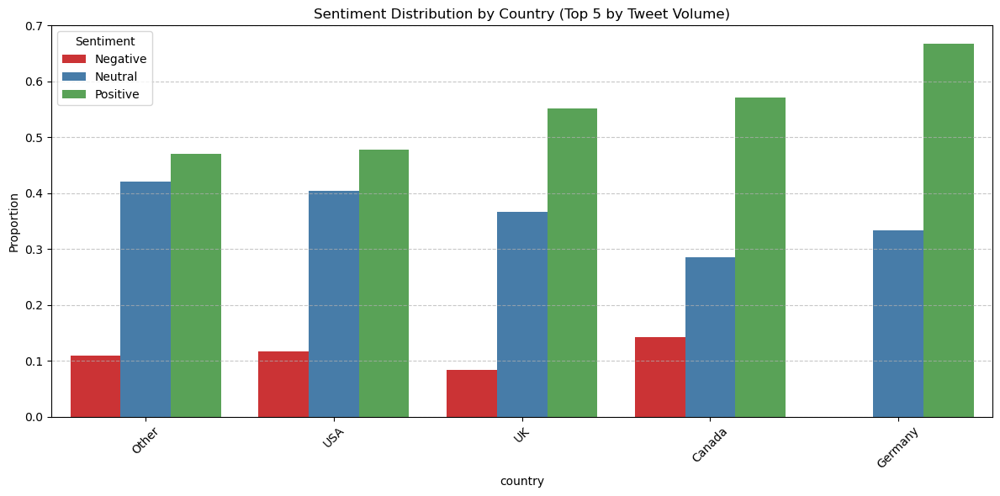

In [146]:
# Group by country and sentiment
sentiment_by_country = df.groupby(['country', 'sentiment_label']).size().unstack().fillna(0)

# Normalize by row
sentiment_ratio = (sentiment_by_country.T / sentiment_by_country.sum(axis=1)).T

import seaborn as sns
import matplotlib.pyplot as plt

# Get top countries (by tweet count) for focus
top_countries = sentiment_by_country.sum(axis=1).sort_values(ascending=False).head(5).index
top_sentiment_ratio = sentiment_ratio.loc[top_countries].reset_index().melt(id_vars='country', 
                                                                             var_name='Sentiment', 
                                                                             value_name='Ratio')

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(data=top_sentiment_ratio, x='country', y='Ratio', hue='Sentiment', palette='Set1')
plt.title("Sentiment Distribution by Country (Top 5 by Tweet Volume)")
plt.ylabel("Proportion")
plt.xticks(rotation=45)
plt.legend(title="Sentiment")
plt.tight_layout()
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

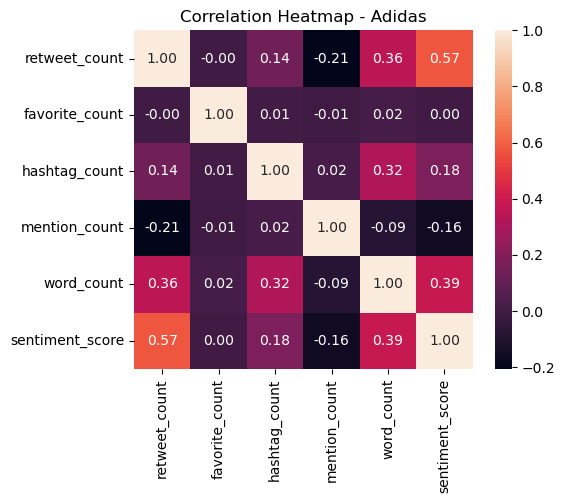

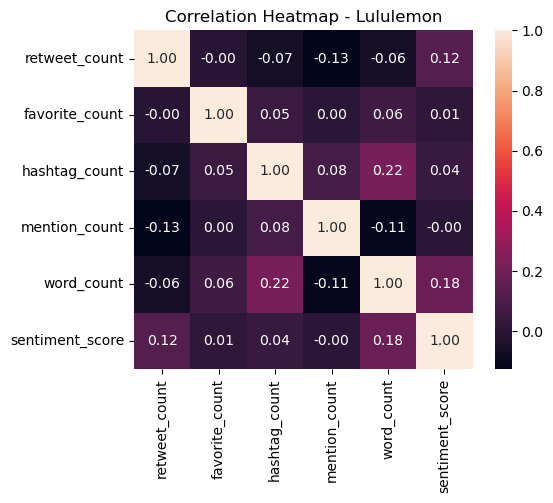

In [147]:
# Columns to include in correlation
cols_of_interest = [
    'retweet_count', 'favorite_count', 'hashtag_count',
    'mention_count', 'word_count', 'sentiment_score'
]

# Loop through each brand and plot heatmap
brands = df['brand'].unique()

for brand in brands:
    brand_df = df[df['brand'] == brand]
    corr = brand_df[cols_of_interest].corr()

    plt.figure(figsize=(6, 5))
    sns.heatmap(corr, annot=True, cmap='rocket', fmt=".2f", square=True)
    plt.title(f'Correlation Heatmap - {brand}')
    plt.tight_layout()
    plt.show()

Correlation heatmaps reveal that retweet count is strongly correlated with sentiment for Adidas (0.75) but only weakly for Lululemon (0.21), suggesting greater emotional response to Adidas content.

# Section 4
# TOPIC MODELLING
## A) ADIDAS:
## i) LDA Topics for Adidas:

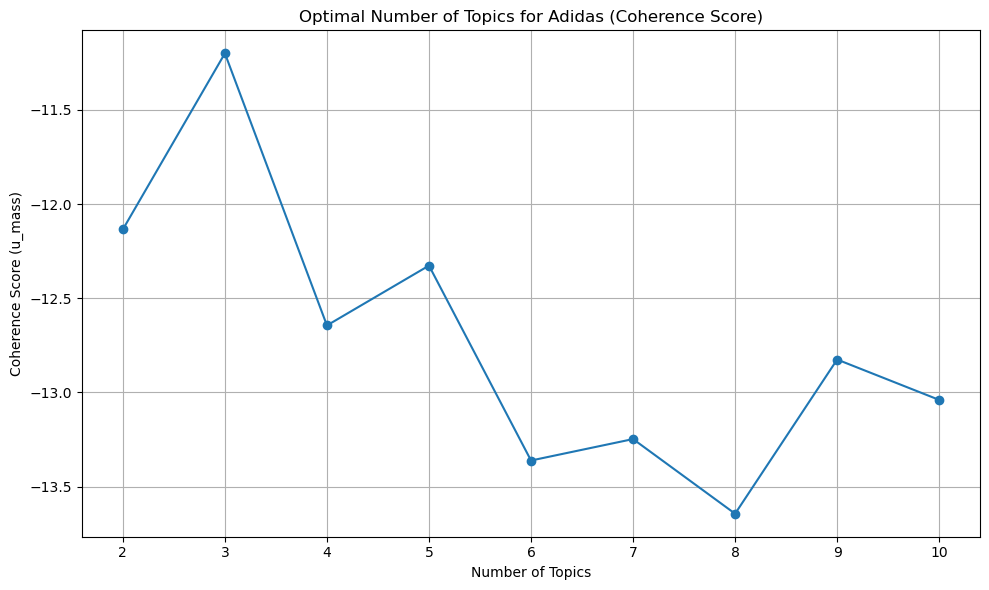

In [43]:
import matplotlib.pyplot as plt
from gensim.models import CoherenceModel
from gensim import corpora
from sklearn.feature_extraction.text import CountVectorizer
import gensim
import pandas as pd

# Prepare Adidas data
adidas_texts = df[df['brand'] == 'Adidas']['clean_text'].dropna().tolist()
vectorizer = CountVectorizer(max_df=0.95, min_df=5, stop_words='english')
dtm = vectorizer.fit_transform(adidas_texts)
adidas_corpus = gensim.matutils.Sparse2Corpus(dtm, documents_columns=False)
id2word = corpora.Dictionary([vectorizer.get_feature_names_out()])

# Function to compute coherence for different topic numbers
def compute_coherence_values(dictionary, corpus, texts, start, limit, step):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = gensim.models.LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, random_state=42)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, corpus=corpus, coherence='u_mass')
        coherence_values.append(coherencemodel.get_coherence())
    return model_list, coherence_values

# Run the function for topic range
model_list, coherence_values = compute_coherence_values(dictionary=id2word, corpus=adidas_corpus,
                                                         texts=adidas_texts, start=2, limit=11, step=1)

# Plot the coherence scores
plt.figure(figsize=(10, 6))
x = range(2, 11)
plt.plot(x, coherence_values, marker='o')
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score (u_mass)")
plt.title("Optimal Number of Topics for Adidas (Coherence Score)")
plt.grid(True)
plt.tight_layout()
plt.show()

In [232]:
!pip install wordcloud
!pip install matplotlib

In [174]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction import text

# 1. Filter Adidas tweets
adidas_docs = df[df['brand'] == 'Adidas']['clean_text'].dropna()

# 2. Combine English and custom stop words, and convert to list
custom_stop_words = list(text.ENGLISH_STOP_WORDS.union(['adidas']))

# 3. Vectorizer
vectorizer = CountVectorizer(
    max_df=0.95,
    min_df=5,
    stop_words=custom_stop_words,
    ngram_range=(1, 2)
)

# 4. Document-Term Matrix
adidas_dtm = vectorizer.fit_transform(adidas_docs)

# 5. LDA model
lda_model_adidas = LatentDirichletAllocation(n_components=5, random_state=42)
lda_model_adidas.fit(adidas_dtm)

# 6. Display topics
def display_topics(model, feature_names, no_top_words=10):
    for topic_idx, topic in enumerate(model.components_):
        top_features = [feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]
        print(f"\nTopic {topic_idx + 1}: {' | '.join(top_features)}")

# 7. Output topics
print("Adidas Topics:")
display_topics(lda_model_adidas, vectorizer.get_feature_names_out())

Adidas Topics:

Topic 1: new | brand | help | win | running | giveaway | brand new | nft | boston | adizero

Topic 2: didnt | inspire | generation | inspire generation | maybes | impossibleisnothing | donovan | chose | mitchell | listen

Topic 3: ill | number | gear | send | ball | thinking | customer | court | nfl | giveaway

Topic 4: xbox | xboxsweepstakes | kit | follow | win | chance | exclusive | including | icon | chance win

Topic 5: shoe | look | like | love | xbox | thank | good | got | need | pair


# Word Cloud Generation:

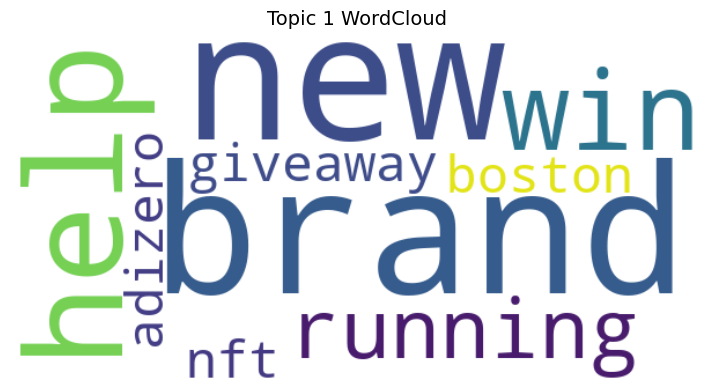

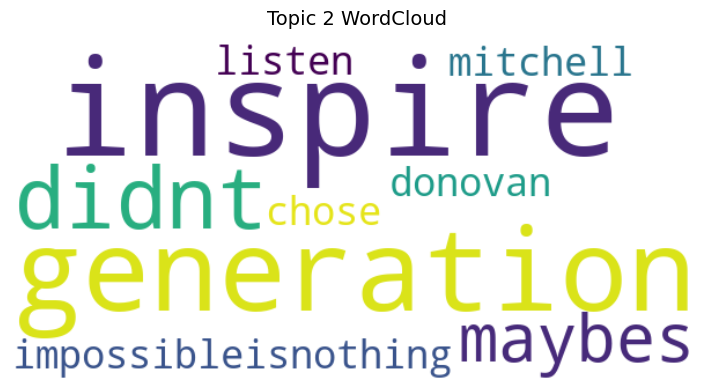

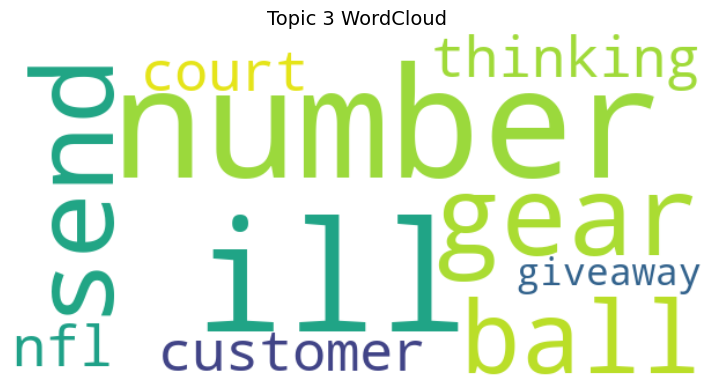

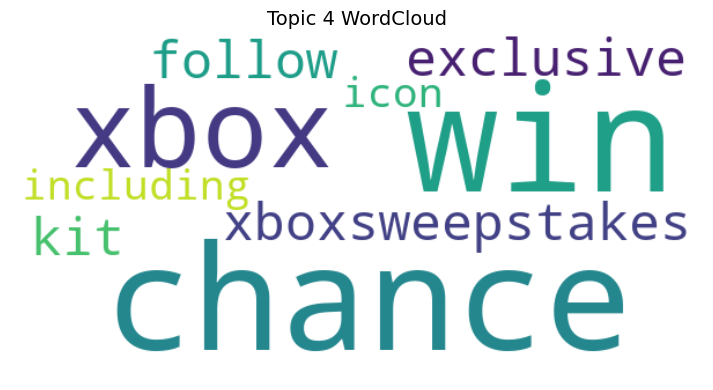

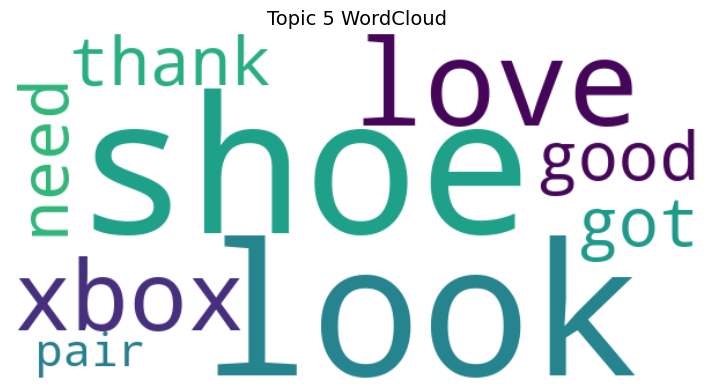

In [175]:
# 6. Plot word clouds for the topics
def plot_wordclouds(topic_keywords):
    for idx, words in enumerate(topic_keywords):
        # Generate the word cloud for each topic
        wordcloud = WordCloud(width=600, height=300, background_color='white').generate(" ".join(words))

        # Create a figure for displaying the word cloud
        plt.figure(figsize=(8, 4))

        # Display the wordcloud image
        plt.imshow(wordcloud, interpolation='bilinear')

        # Add a title to the plot
        plt.title(f"Topic {idx+1} WordCloud", fontsize=14)

        # Hide axes for better presentation
        plt.axis('off')

        # Layout adjustments and force the display
        plt.tight_layout()

        # Explicitly show the plot
        plt.show()  # Ensures the plot appears

# Prepare the list of keywords for each topic
adidas_topic_keywords = []
for i, topic in enumerate(lda_model_adidas.components_):
    top_words = [vectorizer.get_feature_names_out()[i] for i in topic.argsort()[:-11:-1]]
    adidas_topic_keywords.append(top_words)

# Plot word clouds for Adidas topics
plot_wordclouds(adidas_topic_keywords)

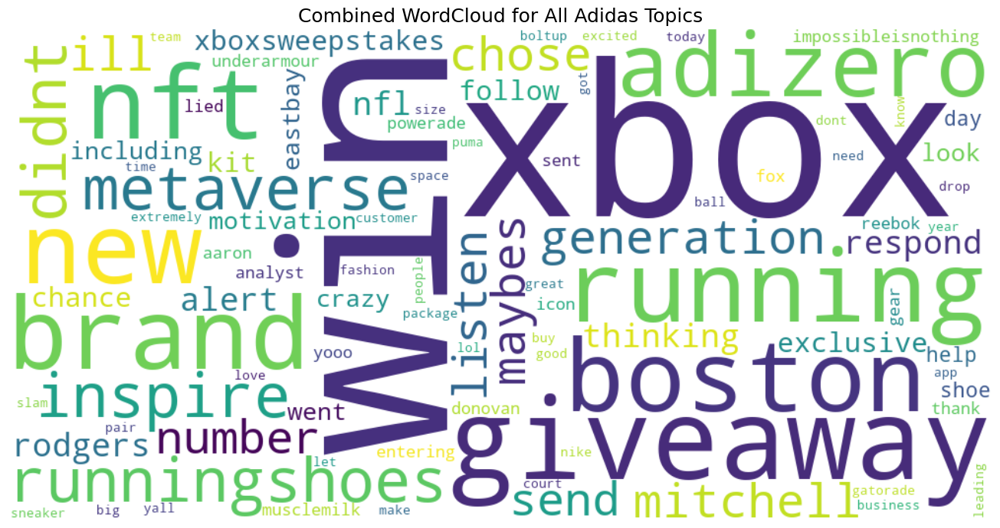

In [182]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# 1. Prepare the list of keywords for each topic — extract more words (e.g., top 30 instead of top 10)
adidas_topic_keywords = []
num_words_per_topic = 30  # Increase for richer combined word cloud

for topic in lda_model_adidas.components_:
    top_words = [vectorizer.get_feature_names_out()[i] for i in topic.argsort()[:-num_words_per_topic - 1:-1]]
    adidas_topic_keywords.append(top_words)

# 2. Plot combined word cloud for all topics
def plot_combined_wordcloud(topic_keywords):
    # Flatten and join all words (including duplicates)
    all_words = " ".join(word for topic in topic_keywords for word in topic)
    
    # Create the word cloud
    wordcloud = WordCloud(
        width=1000,
        height=500,
        background_color='white',
        max_words=200,
        collocations=False  # Avoid showing duplicate bigrams
    ).generate(all_words)

    # Plotting
    plt.figure(figsize=(14, 7))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title("Combined WordCloud for All Adidas Topics", fontsize=18)
    plt.axis('off')
    plt.tight_layout()
    plt.show()

# 3. Call the function
plot_combined_wordcloud(adidas_topic_keywords)


In [78]:
pip install scikit-learn threadpoolctl

Note: you may need to restart the kernel to use updated packages.


## iii)TF-IDF+KMeans Topics for Adidas

In [118]:
# TF-IDF vectorizer
vectorizer = TfidfVectorizer(max_df=0.9, min_df=5, stop_words='english')
X = vectorizer.fit_transform(preprocessed_texts)

# KMeans
kmeans = KMeans(n_clusters=3, n_init=10, random_state=42)
kmeans.fit(X)

# Top keywords per topic
terms = vectorizer.get_feature_names_out()
order_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]

print(" TF-IDF + KMeans Topics for Adidas:\n")
for i in range(3):
    print(f"Topic {i+1}:")
    print(", ".join([terms[ind] for ind in order_centroids[i, :10]]))
    print("")

🔍 TF-IDF + KMeans Topics for Adidas:

Topic 1:
day, today, discount, pant, love, lululemon, thank, new, dont, daysofcheckout

Topic 2:
look, todaywhatever, like, best, asked, dress, shopping, bag, wearing, hey

Topic 3:
mean, doesnt, gentle, reminder, work, feel, wont, working, great, dont



## iv) NMF + TF-IDF Topics for Adidas

In [82]:
from sklearn.decomposition import NMF

# TF-IDF Vectorizer again (you can reuse X if you ran the KMeans step just above)
vectorizer_nmf = TfidfVectorizer(max_df=0.85, min_df=5, stop_words='english')
X_nmf = vectorizer_nmf.fit_transform(preprocessed_texts)

# Fit NMF model
nmf_model = NMF(n_components=3, random_state=42)
nmf_model.fit(X_nmf)

# Get feature names
terms_nmf = vectorizer_nmf.get_feature_names_out()

print("NMF + TF-IDF Topics for Adidas:\n")
for i, topic in enumerate(nmf_model.components_):
    print(f"Topic {i+1}:")
    print(", ".join([terms_nmf[i] for i in topic.argsort()[-10:][::-1]]))
    print("")


🔍 NMF + TF-IDF Topics for Adidas:

Topic 1:
xbox, icon, including, exclusive, follow, kit, chance, win, xboxsweepstakes, yooo

Topic 2:
maybes, generation, inspire, mitchell, chose, listen, donovan, impossibleisnothing, didnt, impossibleisnoth

Topic 3:
xboxsweepstakes, love, awesome, luck, great, good, let, nice, cool, thanks



C:\Users\Samiksha\anaconda3\lib\site-packages\sklearn\decomposition\_nmf.py:1665: ConvergenceWarning:

Maximum number of iterations 200 reached. Increase it to improve convergence.



In [176]:
import pandas as pd
import re
from sklearn.feature_extraction.text import CountVectorizer
import gensim
from gensim import corpora
from sklearn.decomposition import LatentDirichletAllocation
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

# Assuming your dataframe 'df' is already preprocessed
# Filter Adidas-related tweets
adidas_df = df[df['brand'].str.lower() == 'adidas']

# LDA Function (Gensim version)
def run_lda(df, text_col='clean_text', n_topics=5, n_words=10):
    # Convert text column into a document-term matrix (DTM)
    vectorizer = CountVectorizer(max_df=0.95, min_df=5, stop_words='english')
    dtm = vectorizer.fit_transform(df[text_col].dropna())
    
    # Convert DTM to a gensim corpus
    corpus = gensim.matutils.Sparse2Corpus(dtm, documents_columns=False)
    
    # Create Gensim dictionary (mapping words to ids)
    id2word = gensim.corpora.Dictionary()
    id2word.add_documents([vectorizer.get_feature_names_out()])
    
    # Fit Gensim LDA model
    lda_model = gensim.models.LdaModel(corpus=corpus, id2word=id2word, num_topics=n_topics, random_state=42)
    
    # Extract topic keywords
    topic_keywords = []
    
    for i in range(n_topics):
        top_words = [word for word, _ in lda_model.show_topic(i, topn=n_words)]
        topic_keywords.append(top_words)
        print(f"\n Topic {i+1}: " + " | ".join(top_words))
    
    return lda_model, id2word, corpus, topic_keywords

# Running the LDA model for 'clean_text' column (Adidas-related tweets)
lda_model, id2word, corpus, topic_keywords = run_lda(adidas_df, text_col='clean_text', n_topics=5)

# Visualization using pyLDAvis
# Prepare the LDA visualization using gensim's interface to pyLDAvis
lda_vis = gensimvis.prepare(lda_model, corpus, id2word)

# Save the visualization to an HTML file
pyLDAvis.save_html(lda_vis, 'Adidas_lda_visualization_adidas.html')

# To display the visualization inline in Jupyter notebook
pyLDAvis.display(lda_vis)


 Topic 1: chose | win | icon | adidas | new | faster | puma | stock | heat | running

 Topic 2: inspire | generation | impossibleisnothing | listen | maybes | mitchell | donovan | chance | space | christmas

 Topic 3: like | nft | metaverse | people | look | eth | got | drop | sold | came

 Topic 4: xbox | kit | follow | exclusive | xboxsweepstakes | including | nextgen | fitness | win | total

 Topic 5: didnt | adidas | shoe | donovan | need | new | love | store | mitchell | pair


In [177]:
# Save the visualization to an HTML file in the current directory
pyLDAvis.save_html(lda_vis, 'Adidas_lda_visualization_adidas.html')

In [178]:
from IPython.display import FileLink

# Generate a clickable download link
FileLink('Adidas_lda_visualization_adidas.html')  # Adjust the path if necessary

C:\Users\Samiksha\Downloads\Adidas_lda_visualization_adidas.html

In [179]:
# Transform document-term matrix with the LDA model
topic_distribution = lda_model_adidas.transform(adidas_dtm)

# Assign the most likely topic (0-indexed)
adidas_docs = adidas_docs.reset_index(drop=True)
df_topics = pd.DataFrame(topic_distribution, columns=[f'Topic_{i+1}' for i in range(lda_model_adidas.n_components)])
adidas_docs_with_topics = pd.concat([adidas_docs, df_topics], axis=1)
adidas_docs_with_topics['dominant_topic'] = df_topics.idxmax(axis=1)

In [180]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
import nltk
nltk.download('vader_lexicon')

# Initialize VADER
sid = SentimentIntensityAnalyzer()

# Define function to apply VADER sentiment
def get_vader_sentiment(text):
    score = sid.polarity_scores(text)['compound']
    if score >= 0.05:
        return 'Positive'
    elif score <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

# Apply it to your clean text
df['vader_sentiment'] = df['clean_text'].apply(get_vader_sentiment)
# Join sentiment data back to the topic DataFrame
df_sentiment = df[['clean_text', 'sentiment_score', 'vader_sentiment']]
merged = pd.merge(adidas_docs_with_topics, df_sentiment, left_on='clean_text', right_on='clean_text', how='inner')
sentiment_by_topic = merged.groupby('dominant_topic')['vader_sentiment'].value_counts(normalize=True).unstack().fillna(0).round(2)
print(sentiment_by_topic)

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\Samiksha\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


vader_sentiment  Negative  Neutral  Positive
dominant_topic                              
Topic_1              0.00     1.00      0.00
Topic_2              0.00     0.01      0.99
Topic_3              0.75     0.03      0.22
Topic_4              0.00     0.01      0.99
Topic_5              0.67     0.13      0.20


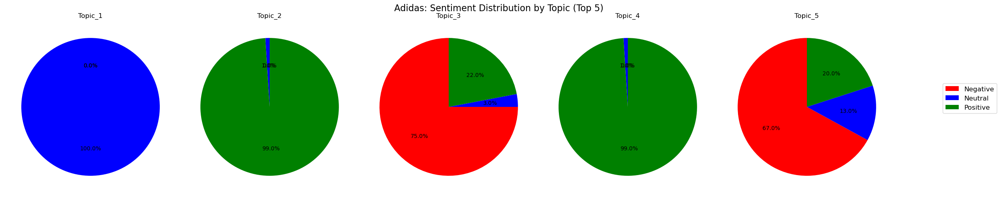

In [181]:
import matplotlib.pyplot as plt

# Updated sentiment distribution with 5 topics
sentiment_data_adidas_updated = {
    'Topic_1': {'Negative': 0.00, 'Neutral': 1.00, 'Positive': 0.00},
    'Topic_2': {'Negative': 0.00, 'Neutral': 0.01, 'Positive': 0.99},
    'Topic_3': {'Negative': 0.75, 'Neutral': 0.03, 'Positive': 0.22},
    'Topic_4': {'Negative': 0.00, 'Neutral': 0.01, 'Positive': 0.99},
    'Topic_5': {'Negative': 0.67, 'Neutral': 0.13, 'Positive': 0.20},
}

# Classic sentiment colors: red = Negative, blue = Neutral, green = Positive
colors = ['red', 'blue', 'green']

# Create subplots for 5 topics
fig, axes = plt.subplots(1, 5, figsize=(25, 5))

# Plot each topic's sentiment distribution
for i, (topic, sentiments) in enumerate(sentiment_data_adidas_updated.items()):
    sizes = list(sentiments.values())
    wedges, texts, autotexts = axes[i].pie(
        sizes, colors=colors, startangle=90, autopct='%1.1f%%'
    )
    axes[i].set_title(topic, fontsize=12)

# Add a shared legend
fig.legend(['Negative', 'Neutral', 'Positive'], loc='center right', fontsize=12)
plt.suptitle("Adidas: Sentiment Distribution by Topic (Top 5)", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()


## B) LULEMON:

## i)LDA Topics for Lululemon:

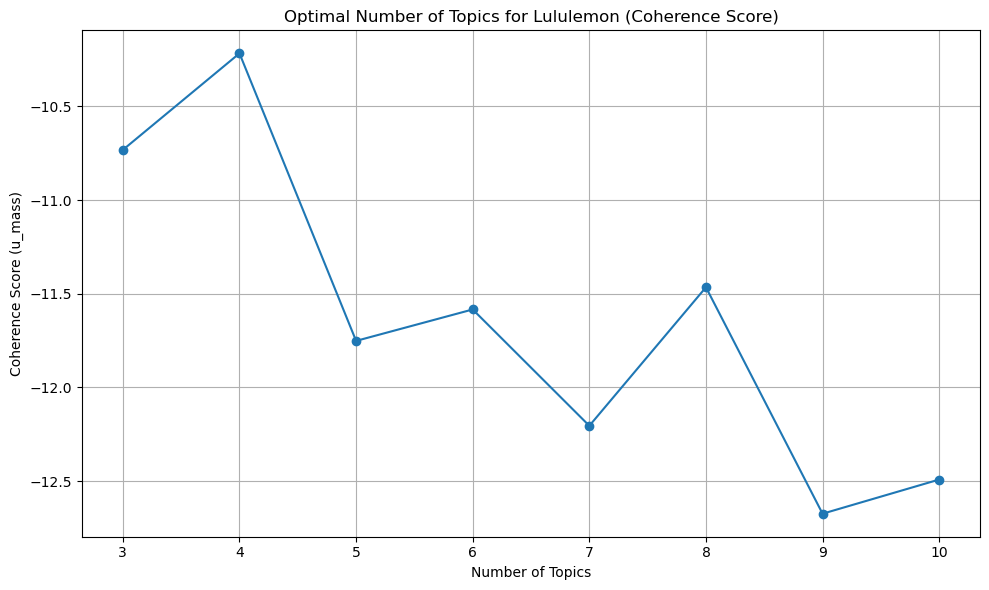

In [154]:
from sklearn.feature_extraction.text import CountVectorizer
from gensim import corpora, models
from gensim.models import CoherenceModel
import matplotlib.pyplot as plt
import pandas as pd

# Filter Lululemon tweets
lululemon_docs = df[df['brand'].str.lower() == 'lululemon']['clean_text'].dropna()

# Vectorize the documents
vectorizer = CountVectorizer(max_df=0.95, min_df=5, stop_words='english')
lululemon_dtm = vectorizer.fit_transform(lululemon_docs)

# Convert DTM to gensim corpus
corpus = gensim.matutils.Sparse2Corpus(lululemon_dtm, documents_columns=False)

# Create gensim dictionary
id2word = corpora.Dictionary()
id2word.add_documents([vectorizer.get_feature_names_out()])

# Compute coherence scores for different numbers of topics
coherence_scores = []
topic_range = range(3, 11)

for num_topics in topic_range:
    lda_model = models.LdaModel(corpus=corpus, id2word=id2word, num_topics=num_topics, random_state=42)
    coherence_model = CoherenceModel(model=lda_model, corpus=corpus, coherence='u_mass')
    coherence_score = coherence_model.get_coherence()
    coherence_scores.append(coherence_score)

# Plot coherence scores
plt.figure(figsize=(10, 6))
plt.plot(topic_range, coherence_scores, marker='o')
plt.title("Optimal Number of Topics for Lululemon (Coherence Score)")
plt.xlabel("Number of Topics")
plt.ylabel("Coherence Score (u_mass)")
plt.grid(True)
plt.tight_layout()
plt.show()

In [173]:
# 1. Prepare your documents (update column name as per your data)
lululemon_documents = df[df['brand'].str.lower() == 'lululemon']['clean_text'].dropna()

# 2. Vectorize with CountVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# Vectorization
vectorizer = CountVectorizer(max_df=0.95, min_df=5, stop_words='english')
lululemon_dtm = vectorizer.fit_transform(lululemon_documents)

# 3. Fit LDA Model with 4 topics
lda_model_lululemon = LatentDirichletAllocation(n_components=4, random_state=42)
lda_model_lululemon.fit(lululemon_dtm)

# 4. Display topics
def display_topics(model, feature_names, no_top_words=10):
    for topic_idx, topic in enumerate(model.components_):
        top_features = [feature_names[i] for i in topic.argsort()[:-no_top_words - 1:-1]]
        print(f"\n Topic {topic_idx + 1}: {' | '.join(top_features)}")

# Displaying the topics
display_topics(lda_model_lululemon, vectorizer.get_feature_names_out())


 Topic 1: brand | coal | love | supply | chain | renewable | legging | line | day | make

 Topic 2: discount | order | customer | healthcare | service | worker | company | coal | youre | holiday

 Topic 3: pant | dont | like | thank | need | want | yoga | work | right | feel

 Topic 4: today | new | day | like | look | lululemon | hour | best | store | use



 Topic 1: brand | coal | love | supply | chain | renewable | legging | line | day | make

 Topic 2: discount | order | customer | healthcare | service | worker | company | coal | youre | holiday

 Topic 3: pant | dont | like | thank | need | want | yoga | work | right | feel

 Topic 4: today | new | day | like | look | lululemon | hour | best | store | use


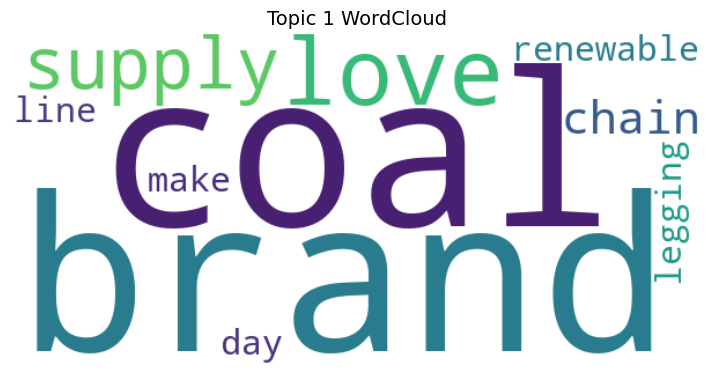

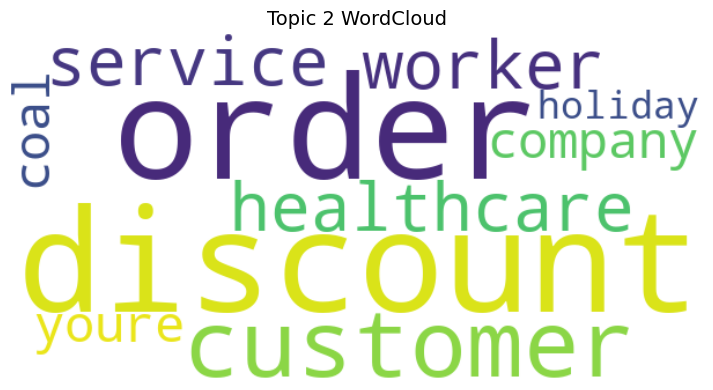

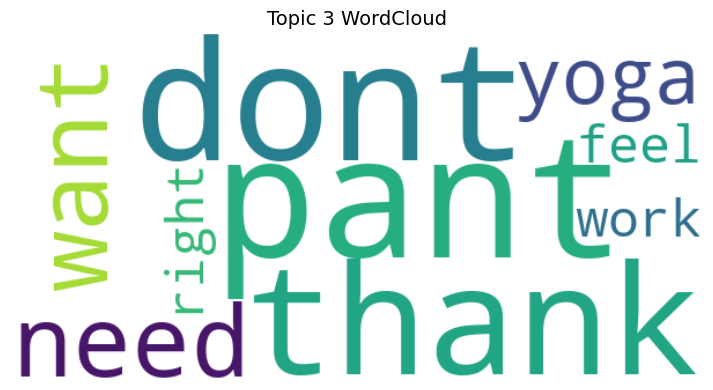

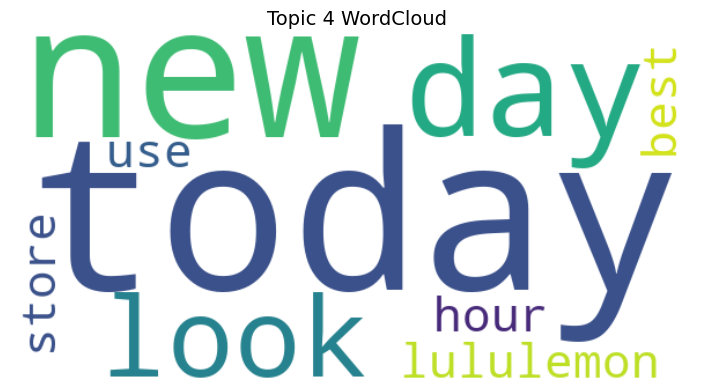

In [157]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# LDA Function (Lululemon Data) - UPDATED to 4 topics
def run_lda(df, text_col='clean_text', n_topics=4, n_words=10):
    # Vectorization of the text data
    vectorizer = CountVectorizer(max_df=0.95, min_df=5, stop_words='english')
    dtm = vectorizer.fit_transform(df[text_col].dropna())  # Document-Term Matrix

    # Fit the LDA model with 4 topics
    lda_model = LatentDirichletAllocation(n_components=n_topics, random_state=42)
    lda_model.fit(dtm)

    # Extracting topic keywords
    words = vectorizer.get_feature_names_out()
    topic_keywords = []

    for i, topic in enumerate(lda_model.components_):
        top_words = [words[i] for i in topic.argsort()[-n_words:][::-1]]
        topic_keywords.append(top_words)
        print(f"\n Topic {i+1}: " + " | ".join(top_words))

    return lda_model, vectorizer, dtm, topic_keywords

# Plotting WordCloud Function
def plot_wordclouds(topic_keywords):
    for idx, words in enumerate(topic_keywords):
        wordcloud = WordCloud(width=600, height=300, background_color='white').generate(" ".join(words))
        plt.figure(figsize=(8, 4))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f"Topic {idx+1} WordCloud", fontsize=14)
        plt.axis('off')
        plt.tight_layout()
        plt.show()

# Filter Lululemon tweets from your dataframe
lululemon_df = df[df['brand'].str.lower() == 'lululemon']

# Run LDA model for 4 topics
lda_model, vectorizer, dtm, topic_keywords = run_lda(lululemon_df, text_col='clean_text', n_topics=4)

# Plot word clouds for each topic
plot_wordclouds(topic_keywords)


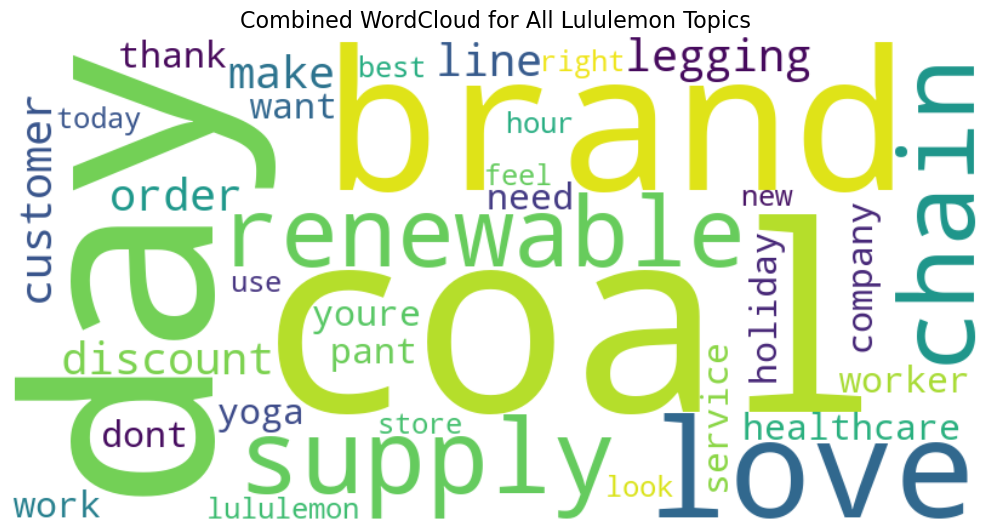

In [158]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Combine all the keywords from all topics into one list
lululemon_combined_keywords = []
for topic in topic_keywords:
    lululemon_combined_keywords.extend(topic)  # Adding all topic words to a list

# Generate a combined word cloud for all Lululemon topics
combined_wordcloud = WordCloud(width=800, height=400, background_color='white').generate(" ".join(lululemon_combined_keywords))

# Plot combined word cloud for all topics
plt.figure(figsize=(10, 6))
plt.imshow(combined_wordcloud, interpolation='bilinear')
plt.title("Combined WordCloud for All Lululemon Topics", fontsize=16)
plt.axis('off')  # Hide axes for better aesthetics
plt.tight_layout()
plt.show()

## iii)TF-IDF + KMeans Topics for Lululemon

In [263]:
from sklearn.cluster import KMeans

# KMeans Clustering
kmeans = KMeans(n_clusters=3, n_init=10, random_state=42)
kmeans.fit(X)

# Top keywords per topic
terms = vectorizer.get_feature_names_out()
order_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]

print("TF-IDF + KMeans Topics for Lululemon:\n")
for i in range(3):
    print(f"Topic {i+1}:")
    print(", ".join([terms[ind] for ind in order_centroids[i, :10]]))
    print("")


TF-IDF + KMeans Topics for Lululemon:

Topic 1:
bert, groot, blessed, drawing, cust, cycling, gorgeous, develop, boar, best

Topic 2:
crystal, gross, creation, allowing, admitted, bold, footed, agent, hit, club

Topic 3:
deaf, bloody, champion, factor, hoping, buying, hop, host, chest, boar



## iv) NMF + TF-IDF Topics for Lululemon:

In [264]:
from sklearn.decomposition import NMF

# Fit NMF model
nmf_model = NMF(n_components=3, random_state=42)
nmf_model.fit(X)

# Get feature names
terms_nmf = vectorizer.get_feature_names_out()

print("NMF + TF-IDF Topics for Lululemon:\n")
for i, topic in enumerate(nmf_model.components_):
    print(f"Topic {i+1}:")
    print(", ".join([terms_nmf[i] for i in topic.argsort()[-10:][::-1]]))
    print("")


NMF + TF-IDF Topics for Lululemon:

Topic 1:
crystal, creation, allowing, gross, apac, going, advance, cooking, buying, bolt

Topic 2:
attention, fair, icetraekicks, getting, apps, bowling, blog, bert, dam, animation

Topic 3:
drawing, husband, boar, highlight, dao, audience, grade, august, day, engagement



In [131]:
pip install pyLDAvis

Note: you may need to restart the kernel to use updated packages.


In [132]:
pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.


In [184]:
import pandas as pd
import gensim
from gensim import corpora
from sklearn.feature_extraction.text import CountVectorizer
import pyLDAvis
import pyLDAvis.gensim_models as gensimvis

# 1. Filter Lululemon tweets
lululemon_df = df[df['brand'].str.lower() == 'lululemon']
texts = lululemon_df['clean_text'].dropna().tolist()

# 2. Vectorize
vectorizer = CountVectorizer(max_df=0.95, min_df=5, stop_words='english')
dtm = vectorizer.fit_transform(texts)

# 3. Convert to Gensim corpus and dictionary
corpus = gensim.matutils.Sparse2Corpus(dtm, documents_columns=False)
id2word = corpora.Dictionary([vectorizer.get_feature_names_out()])

# 4. Train Gensim LDA model
lda_model = gensim.models.LdaModel(
    corpus=corpus,
    id2word=id2word,
    num_topics=4,  # use the number of topics you found optimal
    random_state=42,
    passes=10,
    alpha='auto',
    per_word_topics=True
)

# 5. Show top terms per topic
for i in range(4):
    top_words = lda_model.show_topic(i, topn=10)
    print(f"\n🔹 Topic {i+1}: " + " | ".join([word for word, _ in top_words]))

# 6. Visualize with pyLDAvis
lda_vis = gensimvis.prepare(lda_model, corpus, id2word)
pyLDAvis.save_html(lda_vis, 'Lululemon_lda_visualization_4topics.html')

# Optionally display in Jupyter (if needed)
# pyLDAvis.display(lda_vis)



🔹 Topic 1: urge | bird | stance | compassionate | banning | coal | brand | renewable | yoga | wish

🔹 Topic 2: like | discount | healthcare | look | worker | nurse | best | doctor | hey | feel

🔹 Topic 3: legging | lulu | pant | thank | dont | store | great | lululemon | love | need

🔹 Topic 4: order | new | day | year | got | customer | today | service | help | hour


In [185]:
# Save the visualization to an HTML file in the current directory
pyLDAvis.save_html(lda_vis, 'Lululemon_lda_visualization_4topics.html')

In [186]:
from IPython.display import FileLink

# Generate a clickable download link
FileLink('Lululemon_lda_visualization_4topics.html')  # Adjust the path if necessary

C:\Users\Samiksha\Downloads\Lululemon_lda_visualization_4topics.html

In [187]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

# Step 1: Filter clean Lululemon text
lululemon_docs = df[df['brand'] == 'Lululemon']['clean_text'].dropna()

# Step 2: Vectorize with CountVectorizer
lululemon_vectorizer = CountVectorizer(
    max_df=0.95,
    min_df=5,
    stop_words='english',   # Make sure to use valid stop_words format
    ngram_range=(1, 2)
)

lululemon_dtm = lululemon_vectorizer.fit_transform(lululemon_docs)

# Step 3: Fit LDA
from sklearn.decomposition import LatentDirichletAllocation
lda_model_lululemon = LatentDirichletAllocation(n_components=4, random_state=42)
lda_model_lululemon.fit(lululemon_dtm)

LatentDirichletAllocation(n_components=4, random_state=42)

In [188]:
# 1. Transform Lululemon document-term matrix with its LDA model
lululemon_topic_distribution = lda_model_lululemon.transform(lululemon_dtm)

# 2. Assign most likely topic per document
lululemon_docs = lululemon_docs.reset_index(drop=True)
lululemon_topic_df = pd.DataFrame(
    lululemon_topic_distribution,
    columns=[f'Topic_{i+1}' for i in range(lda_model_lululemon.n_components)]
)
lululemon_docs_with_topics = pd.concat([lululemon_docs, lululemon_topic_df], axis=1)
lululemon_docs_with_topics['dominant_topic'] = lululemon_topic_df.idxmax(axis=1)

# 3. Merge VADER sentiment scores back in
df_sentiment = df[['clean_text', 'sentiment_score', 'vader_sentiment']]
merged_lulu = pd.merge(lululemon_docs_with_topics, df_sentiment, on='clean_text', how='inner')

# 4. Group and normalize to compute sentiment distribution per topic
lululemon_sentiment_by_topic = merged_lulu.groupby('dominant_topic')['vader_sentiment']\
                                          .value_counts(normalize=True)\
                                          .unstack().fillna(0).round(2)

# 5. Print result
print("Lululemon VADER Sentiment Distribution by Topic:")
print(lululemon_sentiment_by_topic)

Lululemon VADER Sentiment Distribution by Topic:
vader_sentiment  Negative  Neutral  Positive
dominant_topic                              
Topic_1              0.00     1.00      0.00
Topic_2              0.08     0.05      0.87
Topic_3              0.08     0.51      0.40
Topic_4              0.06     0.12      0.82


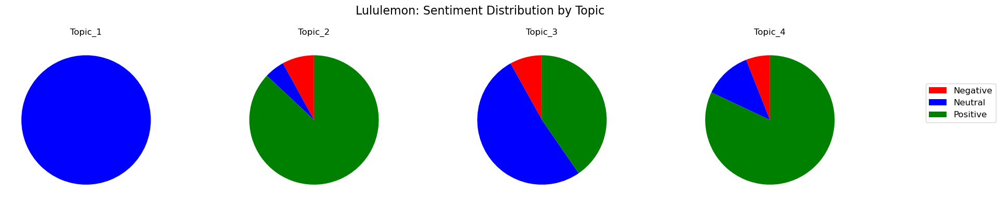

In [189]:
import matplotlib.pyplot as plt

# Classic sentiment colors
colors = ['red', 'blue', 'green']  # Negative, Neutral, Positive

# Updated sentiment data for 4 topics
sentiment_data_lulu = {
    'Topic_1': {'Negative': 0.00, 'Neutral': 1.00, 'Positive': 0.00},
    'Topic_2': {'Negative': 0.08, 'Neutral': 0.05, 'Positive': 0.87},
    'Topic_3': {'Negative': 0.08, 'Neutral': 0.51, 'Positive': 0.40},
    'Topic_4': {'Negative': 0.06, 'Neutral': 0.12, 'Positive': 0.82},
}

# Create subplots for each topic
fig, axes = plt.subplots(1, 4, figsize=(20, 4))

for i, (topic, sentiments) in enumerate(sentiment_data_lulu.items()):
    sizes = list(sentiments.values())
    axes[i].pie(sizes, colors=colors, startangle=90)
    axes[i].set_title(topic, fontsize=12)

# Add a single legend outside the plots
fig.legend(['Negative', 'Neutral', 'Positive'], loc='center right', fontsize=12)
plt.suptitle("Lululemon: Sentiment Distribution by Topic", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()


In [148]:
from sklearn.decomposition import LatentDirichletAllocation
from gensim.models import CoherenceModel
import gensim

# Evaluate Perplexity and Log-Likelihood for LDA model
print(f"LDA Perplexity: {adidas_lda_model.perplexity(adidas_dtm)}")
print(f"LDA Log-Likelihood: {adidas_lda_model.score(adidas_dtm)}")

# If using gensim LDA, you can compute coherence score
adidas_corpus = gensim.matutils.Sparse2Corpus(adidas_dtm, documents_columns=False)
id2word_adidas = gensim.corpora.Dictionary([adidas_vectorizer.get_feature_names_out()])
adidas_lda_gensim = gensim.models.LdaMulticore(corpus=adidas_corpus, id2word=id2word_adidas, num_topics=5, workers=2)
coherence_model_adidas = CoherenceModel(model=adidas_lda_gensim, corpus=adidas_corpus, coherence='u_mass')
coherence_score_adidas = coherence_model_adidas.get_coherence()
print(f"Adidas Topic Coherence: {coherence_score_adidas}")

# Repeat for Lululemon
lululemon_corpus = gensim.matutils.Sparse2Corpus(lululemon_dtm, documents_columns=False)
id2word_lululemon = gensim.corpora.Dictionary([lululemon_vectorizer.get_feature_names_out()])
lululemon_lda_gensim = gensim.models.LdaMulticore(corpus=lululemon_corpus, id2word=id2word_lululemon, num_topics=5, workers=2)
coherence_model_lululemon = CoherenceModel(model=lululemon_lda_gensim, corpus=lululemon_corpus, coherence='u_mass')
coherence_score_lululemon = coherence_model_lululemon.get_coherence()
print(f"Lululemon Topic Coherence: {coherence_score_lululemon}")

LDA Perplexity: 286.6554480287703
LDA Log-Likelihood: -1192635.4869661913
Adidas Topic Coherence: -10.22092629587404
Lululemon Topic Coherence: -8.208195147365636


<Figure size 1200x600 with 0 Axes>

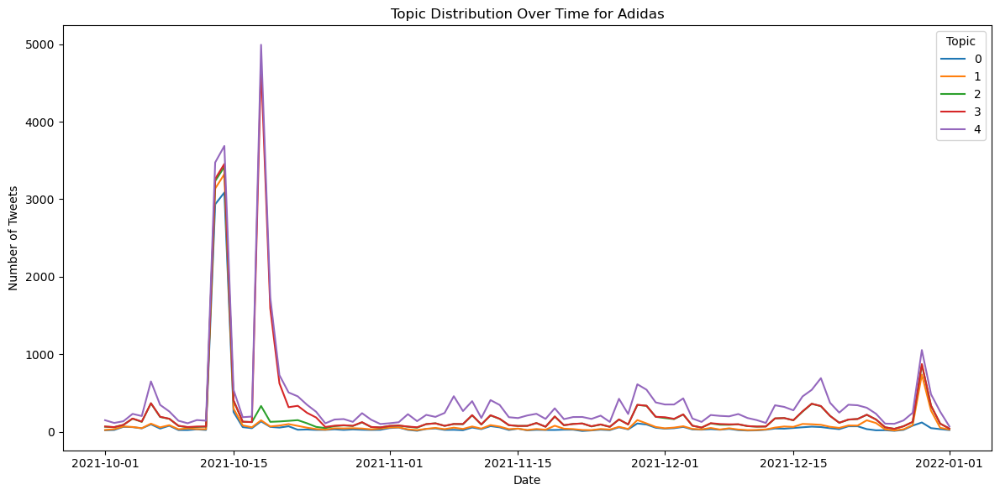

<Figure size 1200x600 with 0 Axes>

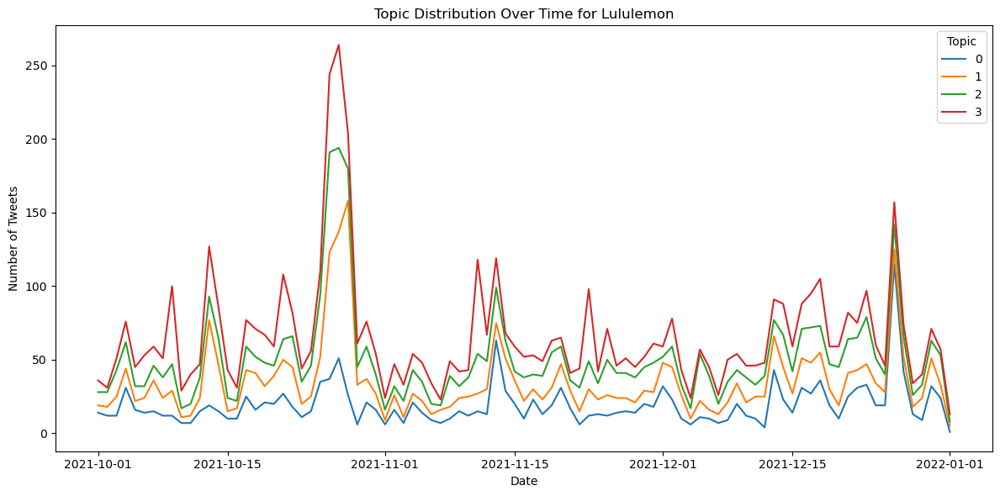

In [190]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer
import gensim
from gensim import corpora

# Convert 'created_at' to datetime
df['created_at'] = pd.to_datetime(df['created_at'])

# Extract date for daily grouping
df['date'] = df['created_at'].dt.date

# Filter the DataFrame for Adidas and Lululemon tweets separately
adidas_df = df[df['brand'].str.lower() == 'adidas'].copy()
lululemon_df = df[df['brand'].str.lower() == 'lululemon'].copy()

# Function to get topic distribution for a given brand
def plot_topic_distribution_over_time(df, brand_name, n_topics):
    # Vectorize the text using CountVectorizer
    vectorizer = CountVectorizer(max_df=0.95, min_df=5, stop_words='english')
    dtm = vectorizer.fit_transform(df['clean_text'].dropna())
    
    # Convert DTM to a Gensim corpus
    corpus = gensim.matutils.Sparse2Corpus(dtm, documents_columns=False)
    
    # Create Gensim dictionary (mapping words to ids)
    id2word = gensim.corpora.Dictionary()
    id2word.add_documents([vectorizer.get_feature_names_out()])
    
    # Fit Gensim LDA model
    lda_model = gensim.models.LdaModel(corpus=corpus, id2word=id2word, num_topics=n_topics, random_state=42)
    
    # Get topic distribution for each tweet
    topic_distribution = [lda_model.get_document_topics(doc) for doc in corpus]
    
    # Extract dominant topic per tweet
    dominant_topics = [max(doc, key=lambda x: x[1])[0] if doc else None for doc in topic_distribution]
    
    # Add to DataFrame
    df = df.loc[df['clean_text'].notnull()].copy()
    df['dominant_topic'] = dominant_topics

    # Group by date and topic
    topic_over_time = df.groupby('date')['dominant_topic'].value_counts().unstack(fill_value=0)
    
    # Plot
    plt.figure(figsize=(12, 6))
    topic_over_time.plot(kind='line', stacked=True, figsize=(12, 6))
    plt.title(f'Topic Distribution Over Time for {brand_name}')
    plt.xlabel('Date')
    plt.ylabel('Number of Tweets')
    plt.legend(title='Topic')
    plt.tight_layout()
    plt.show()

# Run separately for Adidas (3 topics) and Lululemon (4 topics)
plot_topic_distribution_over_time(adidas_df, 'Adidas', n_topics=5)
plot_topic_distribution_over_time(lululemon_df, 'Lululemon', n_topics=4)

## C) Sentimental Topic Modelling:

In [167]:
# Assign sentiment labels based on the sentiment score
df['sentiment_label'] = df['sentiment_score'].apply(
    lambda x: 'Positive' if x > 0 else ('Negative' if x < 0 else 'Neutral')
)

# Verify that sentiment labels are assigned correctly
print(df['sentiment_label'].value_counts())


sentiment_label
Neutral     21707
Positive    18067
Negative     4606
Name: count, dtype: int64


In [168]:
# Filter positive tweets
positive_tweets = df[df['sentiment_label'] == 'Positive']
print(f"Number of positive tweets: {len(positive_tweets)}")

# Check the first few rows of positive tweets
print(positive_tweets.head())


Number of positive tweets: 18067
                 created_at                   id  \
0 2021-10-01 07:37:16+00:00  1443842433641558000   
2 2021-10-01 07:13:08+00:00  1443836362394849300   
5 2021-10-01 09:43:02+00:00  1443874086350901200   
7 2021-10-01 09:36:09+00:00  1443872354631929900   
9 2021-10-01 07:00:16+00:00  1443833125231079400   

                                           full_text  is_quote_status  \
0  @_christiankeith @d1vetsam @KicksFinder They a...            False   
2  RT @R_Riakporhe: It’s been a real struggle to ...            False   
5  The Adidas Trae Young 1 “ICEE” is available on...            False   
7  @Asante_Jedi @TheyScoredNone @dontblink_27 @ad...            False   
9  It’s been a real struggle to get here but with...            False   

   retweet_count  favorite_count              user.id          user.name  \
0              0               0   723347581586255900               Nate   
2              3               0            492598592    Ayden 

In [170]:
# Filter tweets by brand and sentiment labels
adidas_positive_tweets = df[(df['brand'] == 'Adidas') & (df['sentiment_label'] == 'Positive')]
adidas_negative_tweets = df[(df['brand'] == 'Adidas') & (df['sentiment_label'] == 'Negative')]
adidas_neutral_tweets = df[(df['brand'] == 'Adidas') & (df['sentiment_label'] == 'Neutral')]

lululemon_positive_tweets = df[(df['brand'] == 'Lululemon') & (df['sentiment_label'] == 'Positive')]
lululemon_negative_tweets = df[(df['brand'] == 'Lululemon') & (df['sentiment_label'] == 'Negative')]
lululemon_neutral_tweets = df[(df['brand'] == 'Lululemon') & (df['sentiment_label'] == 'Neutral')]

In [171]:
# Function for KMeans Topic Modeling
def kmeans_topic_modelling(tweets, num_clusters=3):
    vectorizer = TfidfVectorizer(lowercase=True, max_features=100, max_df=0.8, min_df=2, ngram_range=(1, 2), stop_words='english')
    vectors = vectorizer.fit_transform(tweets)

    # Apply KMeans clustering
    model = KMeans(n_clusters=num_clusters, init='k-means++', n_init=1, random_state=42)
    model.fit(vectors)

    # Get the centroids and terms
    centroids = model.cluster_centers_
    order_centroids = centroids.argsort()[:, ::-1]
    terms = vectorizer.get_feature_names_out()

    # Print the topics for each cluster
    topics = []
    for i in range(num_clusters):
        top_terms = [terms[ind] for ind in order_centroids[i, :10]]
        topics.append(top_terms)
        print(f"Topic {i}: {top_terms}")

    # Assign topics to tweets
    tweet_topics = model.predict(vectors)
    return tweet_topics, topics

In [173]:
# Function to generate word clouds for tweets
def generate_wordcloud(tweets):
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(" ".join(tweets))
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.show()

# i) Adidas Sentimetal Topic Modelling:

Performing topic modeling for Adidas Positive tweets:
Topic 0: ['xbox', 'including xbox', 'kit including', 'follow xboxsweepstakes', 'xbox follow', 'icon xbox', 'xboxsweepstakes chance', 'win exclusive', 'exclusive kit', 'chance win']
Topic 1: ['like', 'really', 'dont', 'look', 'brand', 'love', 'good', 'know', 'shoe', 'make']
Topic 2: ['new', 'adidas', 'love', 'good', 'shoe', 'thanks', 'great', 'available', 'brand', 'year']
Adidas Positive Tweet Topics:
Topic 0: ['xbox', 'including xbox', 'kit including', 'follow xboxsweepstakes', 'xbox follow', 'icon xbox', 'xboxsweepstakes chance', 'win exclusive', 'exclusive kit', 'chance win']
Topic 1: ['like', 'really', 'dont', 'look', 'brand', 'love', 'good', 'know', 'shoe', 'make']
Topic 2: ['new', 'adidas', 'love', 'good', 'shoe', 'thanks', 'great', 'available', 'brand', 'year']


C:\Users\Samiksha\AppData\Local\Temp\ipykernel_8932\2981006691.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



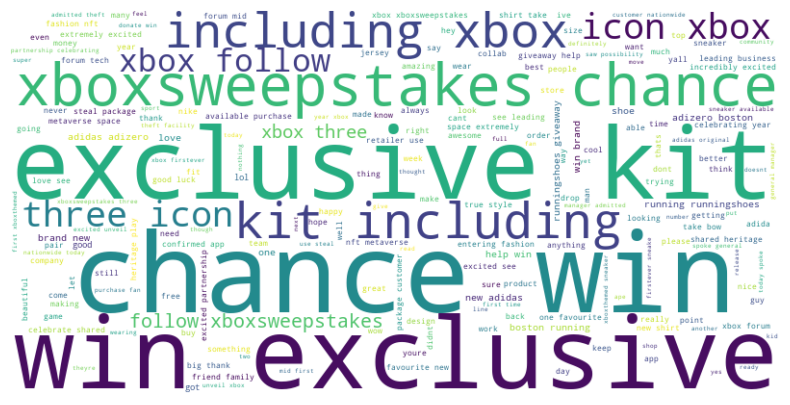


Performing topic modeling for Adidas Negative tweets:
Topic 0: ['adidas', 'game', 'like', 'shoe', 'black', 'day', 'impossible', 'time', 'ill', 'long']
Topic 1: ['ill send', 'send gear', 'alert thinking', 'respond ill', 'gear peo', 'giveaway', 'giveaway alert', 'peo', 'number respond', 'alert']
Topic 2: ['yooo went', 'went crazy', 'look sent', 'crazy look', 'sent xbox', 'yooo', 'went', 'sent', 'xbox', 'crazy']
Adidas Negative Tweet Topics:
Topic 0: ['adidas', 'game', 'like', 'shoe', 'black', 'day', 'impossible', 'time', 'ill', 'long']
Topic 1: ['ill send', 'send gear', 'alert thinking', 'respond ill', 'gear peo', 'giveaway', 'giveaway alert', 'peo', 'number respond', 'alert']
Topic 2: ['yooo went', 'went crazy', 'look sent', 'crazy look', 'sent xbox', 'yooo', 'went', 'sent', 'xbox', 'crazy']


C:\Users\Samiksha\AppData\Local\Temp\ipykernel_8932\2981006691.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



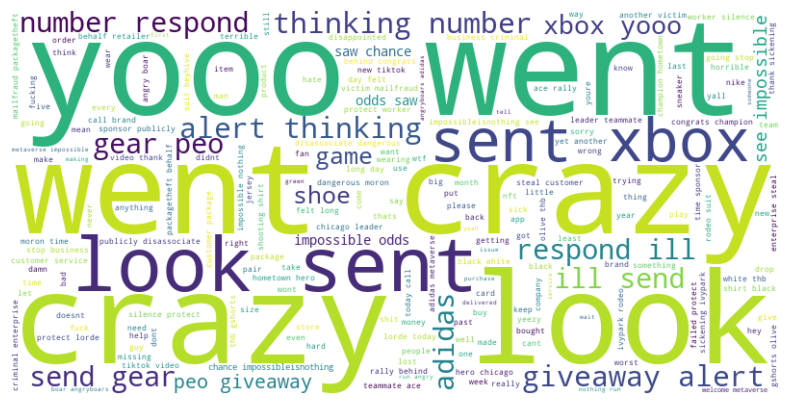


Performing topic modeling for Adidas Neutral tweets:
Topic 0: ['like', 'today', 'look', 'adidas', 'metaverse', 'drop', 'shoe', 'brand', 'dont', 'got']
Topic 1: ['inspire generation', 'inspire', 'maybes', 'generation', 'generation impossibleisnothing', 'impossibleisnothing', 'chose inspire', 'chose', 'maybes chose', 'listen maybes']
Topic 2: ['xboxsweepstakes', 'adidas', 'shoe', 'need', 'got', 'let', 'want', 'time', 'day', 'boltup']
Adidas Neutral Tweet Topics:
Topic 0: ['like', 'today', 'look', 'adidas', 'metaverse', 'drop', 'shoe', 'brand', 'dont', 'got']
Topic 1: ['inspire generation', 'inspire', 'maybes', 'generation', 'generation impossibleisnothing', 'impossibleisnothing', 'chose inspire', 'chose', 'maybes chose', 'listen maybes']
Topic 2: ['xboxsweepstakes', 'adidas', 'shoe', 'need', 'got', 'let', 'want', 'time', 'day', 'boltup']


C:\Users\Samiksha\AppData\Local\Temp\ipykernel_8932\2981006691.py:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



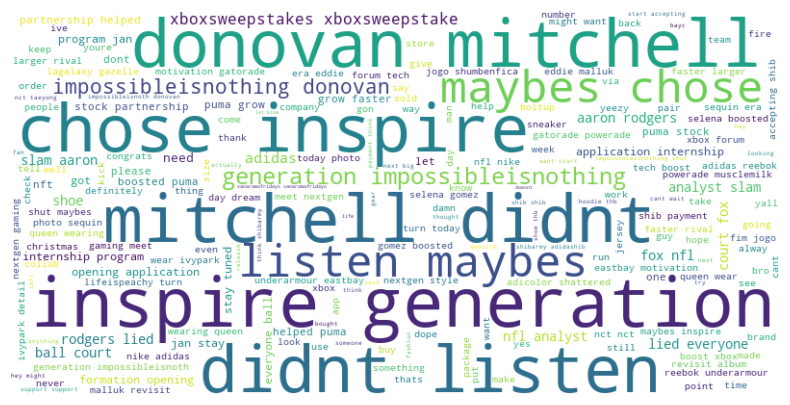

In [176]:
# Perform topic modeling for Adidas Positive tweets
print("Performing topic modeling for Adidas Positive tweets:")
adidas_positive_tweet_topics, adidas_positive_topics = kmeans_topic_modelling(adidas_positive_tweets['clean_text'])
adidas_positive_tweets['topic'] = adidas_positive_tweet_topics
print("Adidas Positive Tweet Topics:")
for i, topic in enumerate(adidas_positive_topics):
    print(f"Topic {i}: {topic}")
generate_wordcloud(adidas_positive_tweets['clean_text'])

# Perform topic modeling for Adidas Negative tweets
print("\nPerforming topic modeling for Adidas Negative tweets:")
adidas_negative_tweet_topics, adidas_negative_topics = kmeans_topic_modelling(adidas_negative_tweets['clean_text'])
adidas_negative_tweets['topic'] = adidas_negative_tweet_topics
print("Adidas Negative Tweet Topics:")
for i, topic in enumerate(adidas_negative_topics):
    print(f"Topic {i}: {topic}")
generate_wordcloud(adidas_negative_tweets['clean_text'])

# Perform topic modeling for Adidas Neutral tweets
print("\nPerforming topic modeling for Adidas Neutral tweets:")
adidas_neutral_tweet_topics, adidas_neutral_topics = kmeans_topic_modelling(adidas_neutral_tweets['clean_text'])
adidas_neutral_tweets['topic'] = adidas_neutral_tweet_topics
print("Adidas Neutral Tweet Topics:")
for i, topic in enumerate(adidas_neutral_topics):
    print(f"Topic {i}: {topic}")
generate_wordcloud(adidas_neutral_tweets['clean_text'])


# ii) Lululemon Sentimetal Topic Modelling:

Performing topic modeling for Lululemon Positive tweets:
Topic 0: ['new', 'like', 'good', 'best', 'lululemon', 'thanks', 'great', 'look', 'thank', 'day']
Topic 1: ['making yoga', 'pant coalpowered', 'coalpowered factory', 'factory', 'coalpowered', 'producing massive', 'producing', 'preaches', 'practicing preaches', 'practicing']
Topic 2: ['love', 'purchase', 'discount', 'line', 'thats', 'really', 'like', 'day', 'people', 'know']
Lululemon Positive Tweet Topics:
Topic 0: ['new', 'like', 'good', 'best', 'lululemon', 'thanks', 'great', 'look', 'thank', 'day']
Topic 1: ['making yoga', 'pant coalpowered', 'coalpowered factory', 'factory', 'coalpowered', 'producing massive', 'producing', 'preaches', 'practicing preaches', 'practicing']
Topic 2: ['love', 'purchase', 'discount', 'line', 'thats', 'really', 'like', 'day', 'people', 'know']


C:\Users\Samiksha\AppData\Local\Temp\ipykernel_8932\3439973057.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



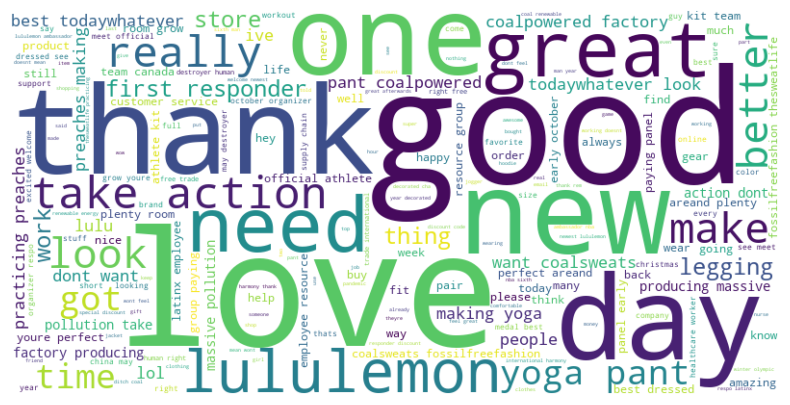


Performing topic modeling for Lululemon Negative tweets:
Topic 0: ['pant', 'year', 'pair', 'wear', 'help', 'black', 'lululemon', 'bad', 'order', 'work']
Topic 1: ['customer', 'service', 'customer service', 'order', 'worst', 'time', 'help', 'chat', 'waiting', 'got']
Topic 2: ['discount', 'mean', 'hour', 'day', 'matter', 'store', 'game', 'work', 'wellbeing', 'legging']
Lululemon Negative Tweet Topics:
Topic 0: ['pant', 'year', 'pair', 'wear', 'help', 'black', 'lululemon', 'bad', 'order', 'work']
Topic 1: ['customer', 'service', 'customer service', 'order', 'worst', 'time', 'help', 'chat', 'waiting', 'got']
Topic 2: ['discount', 'mean', 'hour', 'day', 'matter', 'store', 'game', 'work', 'wellbeing', 'legging']


C:\Users\Samiksha\AppData\Local\Temp\ipykernel_8932\3439973057.py:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



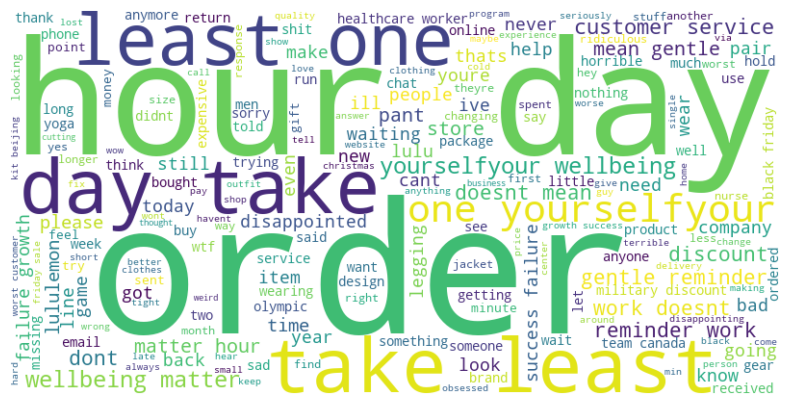


Performing topic modeling for Lululemon Neutral tweets:
Topic 0: ['daysofcheckout', 'need', 'discount', 'lululemon', 'order', 'lulu', 'day', 'store', 'got', 'coal']
Topic 1: ['like', 'dont', 'store', 'discount', 'got', 'use', 'lulu', 'healthcare', 'want', 'order']
Topic 2: ['today', 'thank', 'lululemon', 'store', 'got', 'legging', 'order', 'day', 'lulu', 'beijing']
Lululemon Neutral Tweet Topics:
Topic 0: ['daysofcheckout', 'need', 'discount', 'lululemon', 'order', 'lulu', 'day', 'store', 'got', 'coal']
Topic 1: ['like', 'dont', 'store', 'discount', 'got', 'use', 'lulu', 'healthcare', 'want', 'order']
Topic 2: ['today', 'thank', 'lululemon', 'store', 'got', 'legging', 'order', 'day', 'lulu', 'beijing']


C:\Users\Samiksha\AppData\Local\Temp\ipykernel_8932\3439973057.py:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



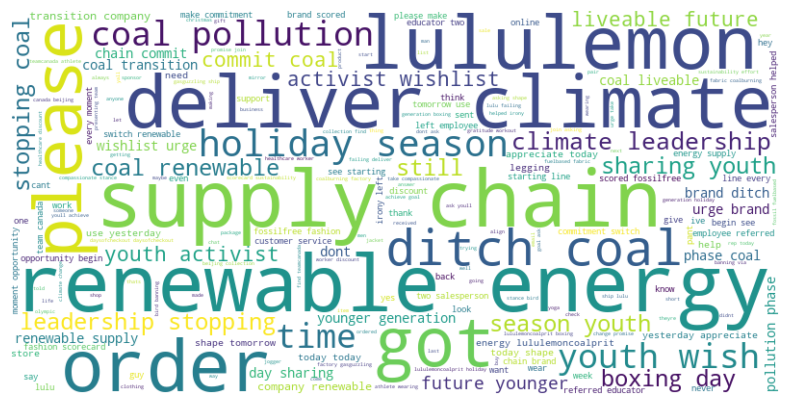

In [177]:
# Perform topic modeling for Lululemon Positive tweets
print("Performing topic modeling for Lululemon Positive tweets:")
lululemon_positive_tweet_topics, lululemon_positive_topics = kmeans_topic_modelling(lululemon_positive_tweets['clean_text'])
lululemon_positive_tweets['topic'] = lululemon_positive_tweet_topics
print("Lululemon Positive Tweet Topics:")
for i, topic in enumerate(lululemon_positive_topics):
    print(f"Topic {i}: {topic}")
generate_wordcloud(lululemon_positive_tweets['clean_text'])

# Perform topic modeling for Lululemon Negative tweets
print("\nPerforming topic modeling for Lululemon Negative tweets:")
lululemon_negative_tweet_topics, lululemon_negative_topics = kmeans_topic_modelling(lululemon_negative_tweets['clean_text'])
lululemon_negative_tweets['topic'] = lululemon_negative_tweet_topics
print("Lululemon Negative Tweet Topics:")
for i, topic in enumerate(lululemon_negative_topics):
    print(f"Topic {i}: {topic}")
generate_wordcloud(lululemon_negative_tweets['clean_text'])

# Perform topic modeling for Lululemon Neutral tweets
print("\nPerforming topic modeling for Lululemon Neutral tweets:")
lululemon_neutral_tweet_topics, lululemon_neutral_topics = kmeans_topic_modelling(lululemon_neutral_tweets['clean_text'])
lululemon_neutral_tweets['topic'] = lululemon_neutral_tweet_topics
print("Lululemon Neutral Tweet Topics:")
for i, topic in enumerate(lululemon_neutral_topics):
    print(f"Topic {i}: {topic}")
generate_wordcloud(lululemon_neutral_tweets['clean_text'])


# Section 5
# Network Analysis:

# Co-Mention Network Analysis:

In [214]:
# Check for mentions in the original 'full_text' column
co_mentions_full_text = df_adidas_lululemon[
    df_adidas_lululemon['full_text'].str.contains('adidas', case=False) & 
    df_adidas_lululemon['full_text'].str.contains('lululemon', case=False)
]
print(co_mentions_full_text)
print(f"Total co-mentions in full text: {len(co_mentions_full_text)}")


                     created_at                   id  \
18478 2021-10-21 15:56:00+00:00  1451215701750988800   

                                               full_text  is_quote_status  \
18478  Coming soon: @lululemon shoes  The activewear ...            False   

       retweet_count  favorite_count     user.id     user.name  \
18478              1               5  1574094733  Fitt Insider   

      user.screen_name user.location  ...  mention_count  sentiment  \
18478      fittinsider       unknown  ...              1  -0.033333   

       subjectivity  token_count  country sentiment_score sentiment_label  \
18478      0.216667           22    Other       -0.033333        Negative   

      follower_group influence_score  dominant_topic  
18478           High               6               1  

[1 rows x 32 columns]
Total co-mentions in full text: 1


In [215]:
# Check for tweets where either Adidas or Lululemon is mentioned
co_mentions_either = df_adidas_lululemon[
    df_adidas_lululemon['clean_text'].str.contains('adidas', case=False) | 
    df_adidas_lululemon['clean_text'].str.contains('lululemon', case=False)
]
print(f"Total mentions of Adidas or Lululemon: {len(co_mentions_either)}")


Total mentions of Adidas or Lululemon: 2882


C:\Users\Samiksha\anaconda3\lib\site-packages\networkx\drawing\nx_pylab.py:304: DeprecationWarning:

`alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.



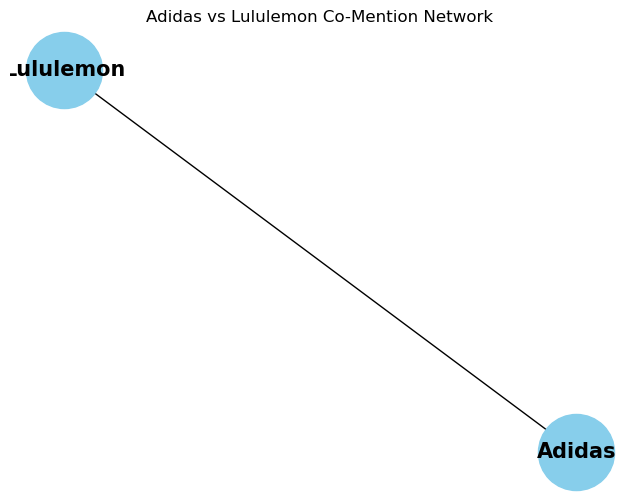

In [216]:
import networkx as nx
import matplotlib.pyplot as plt

# Create an empty graph
G = nx.Graph()

# Loop through the filtered tweets and add edges if both brands are mentioned
for _, row in co_mentions_full_text.iterrows():
    brands_mentioned = set(['adidas', 'lululemon'])  # The brands to check for co-mention
    mentioned_brands = {brand for brand in brands_mentioned if brand.lower() in row['full_text'].lower()}
    
    # Add edge only if both brands are mentioned in the tweet
    if len(mentioned_brands) == 2:
        G.add_edge('Adidas', 'Lululemon')  # Add an edge between Adidas and Lululemon

# Create a figure and axis explicitly for plotting
fig, ax = plt.subplots(figsize=(8, 6))

# Now draw the graph with the axis `ax`
nx.draw(G, with_labels=True, node_size=3000, node_color='skyblue', font_size=15, font_weight='bold', ax=ax)

# Add a title to the plot
ax.set_title('Adidas vs Lululemon Co-Mention Network')

# Display the plot
plt.show()


In [241]:
# Filter tweets that mention Adidas
adidas_tweets = df[df['clean_text'].str.contains('adidas', case=False, na=False)]

# Filter tweets that mention Lululemon
lululemon_tweets = df[df['clean_text'].str.contains('lululemon', case=False, na=False)]

# Show the count of Adidas and Lululemon mentions
print(f"Number of Adidas tweets: {len(adidas_tweets)}")
print(f"Number of Lululemon tweets: {len(lululemon_tweets)}")



Number of Adidas tweets: 2528
Number of Lululemon tweets: 354


In [246]:
# Find users who mentioned both Adidas and Lululemon
both_brands_influencers = set(adidas_tweets['user.id']).intersection(set(lululemon_tweets['user.id']))
print(f"Users who mentioned both Adidas and Lululemon: {both_brands_influencers}")


Users who mentioned both Adidas and Lululemon: {2515846224, 317768634, 12727412, 2351185794}


In [256]:
# Step 1: Filter tweets mentioning both Adidas and Lululemon
adidas_lululemon_interactions = df[(df['clean_text'].str.contains('adidas', case=False)) & 
                                   (df['clean_text'].str.contains('lululemon', case=False))]

# Step 2: Count the number of interactions between Adidas and Lululemon fanbases
# Assuming the `user.id` column represents the user who posted the tweet, and `network` refers to the user being mentioned
# If your dataframe has columns like `retweet_count`, `mention_count`, and `reply_count`, you can aggregate them for interactions.

# Get the unique users who mentioned both Adidas and Lululemon
interacting_users = adidas_lululemon_interactions['user.id'].unique()

# Now calculate the number of interactions
interaction_count = 0

# Loop through all users and check for mentions or retweets from other users
for user in interacting_users:
    # Filter tweets by this user
    user_tweets = df[df['user.id'] == user]
    
    # Count the interactions (retweets or mentions) involving Adidas and Lululemon
    interaction_count += user_tweets[(user_tweets['clean_text'].str.contains('adidas', case=False)) |
                                     (user_tweets['clean_text'].str.contains('lululemon', case=False))]['mention_count'].sum()

# Step 3: Display the number of interactions
print(f"Total interaction count between Adidas and Lululemon fanbases: {interaction_count}")

Total interaction count between Adidas and Lululemon fanbases: 0


# Section 6:
# Micro Influncer Identification:

## Top Adidas Micro Influncers:

In [241]:
import networkx as nx
import pandas as pd

# STEP 1: Filter Adidas-related tweets
adidas_df = df[df['full_text'].str.contains("adidas", case=False, na=False)].copy()
adidas_df = adidas_df[adidas_df['user.id'].notnull()]
adidas_df['user.id'] = adidas_df['user.id'].astype(str)

# STEP 2: Create mapping from @screen_name to user.id
user_map_adidas = adidas_df.dropna(subset=['user.screen_name', 'user.id'])[['user.screen_name', 'user.id']].drop_duplicates()
screen_to_id_adidas = dict(zip(user_map_adidas['user.screen_name'].str.lower(), user_map_adidas['user.id'].astype(str)))

# STEP 3: Resolve mentions to user IDs
resolved_edges = []
for _, row in adidas_df.iterrows():
    author = str(row['user.id'])
    if row['mention_count'] > 0:
        mentions = [word[1:].lower() for word in row['full_text'].split() if word.startswith('@')]
        for mention in mentions:
            mentioned_id = screen_to_id_adidas.get(mention)
            if mentioned_id and mentioned_id != author:
                resolved_edges.append((author, mentioned_id))

# STEP 4: Build the mention network
G_adidas = nx.DiGraph()
G_adidas.add_nodes_from(adidas_df['user.id'].unique())
G_adidas.add_edges_from(resolved_edges)

# STEP 5: Calculate metrics
num_nodes = G_adidas.number_of_nodes()
num_edges = G_adidas.number_of_edges()
density = nx.density(G_adidas) * 100  # as percentage

# Print results
print(f"Adidas Network Metrics:")
print(f"Total nodes (users): {num_nodes}")
print(f"Total edges (mention links): {num_edges}")
print(f"Network density: {density:.4f}%")

Adidas Network Metrics:
Total nodes (users): 29144
Total edges (mention links): 39324
Network density: 0.0046%


In [341]:
#Filter Adidas-related tweets
adidas_df = df[df['full_text'].str.contains("adidas", case=False, na=False)].copy()
adidas_df = adidas_df[adidas_df['user.id'].notnull()]

#Build screen_name ➝ user.id mapping
user_map = adidas_df.dropna(subset=['user.screen_name', 'user.id'])
user_map = user_map[['user.screen_name', 'user.id']].drop_duplicates()
screen_to_id = dict(zip(user_map['user.screen_name'].str.lower(), user_map['user.id'].astype(str)))

#Resolve mentions to user IDs
resolved_edges = []
for _, row in adidas_df.iterrows():
    author = str(row['user.id'])
    if row['mention_count'] > 0:
        mentions = [word[1:].lower() for word in row['full_text'].split() if word.startswith('@')]
        for mention in mentions:
            mentioned_id = screen_to_id.get(mention)
            if mentioned_id and mentioned_id != author:
                resolved_edges.append((author, mentioned_id))

# Build graph with edges and isolated nodes
G = nx.DiGraph()
G.add_nodes_from(adidas_df['user.id'].astype(str).unique())
G.add_edges_from(resolved_edges)

#Centrality
betweenness = nx.betweenness_centrality(G)
closeness = nx.closeness_centrality(G)
degree = dict(G.degree())
in_degree = dict(G.in_degree())
out_degree = dict(G.out_degree())

#Centrality DataFrame
centrality_df = pd.DataFrame({
    'user.id': list(betweenness.keys()),
    'betweenness': list(betweenness.values()),
    'closeness': [closeness.get(uid, 0) for uid in betweenness.keys()],
    'degree': [degree.get(uid, 0) for uid in betweenness.keys()],
    'in_degree': [in_degree.get(uid, 0) for uid in betweenness.keys()],
    'out_degree': [out_degree.get(uid, 0) for uid in betweenness.keys()]
})

In [342]:
#Calculate engagement_rate
adidas_df['engagement_rate'] = (
    (adidas_df['retweet_count'] + adidas_df['favorite_count']) /
    adidas_df['user.followers_count'].replace(0, 1)
)

# Ensure consistent dtypes
adidas_df['user.id'] = adidas_df['user.id'].astype(str)
centrality_df['user.id'] = centrality_df['user.id'].astype(str)

# STEP 1: Aggregate user info
user_info = adidas_df.groupby('user.id').agg({
    'user.screen_name': 'first',
    'user.followers_count': 'first',
    'user.friends_count': 'first',
    'user.location': 'first',
    'user.verified': 'first',
    'sentiment_score': 'mean',
    'retweet_count': 'mean',
    'favorite_count': 'mean',
    'engagement_rate': 'mean'
}).reset_index()

# Rename
user_info.rename(columns={
    'retweet_count': 'avg_retweet_count',
    'favorite_count': 'avg_favorite_count',
    'user.friends_count': 'avg_friends_count',
    'engagement_rate': 'engagement_rate',
    'user.verified': 'verified'
}, inplace=True)

# STEP 2: Merge
result_adidas_df = pd.merge(centrality_df, user_info, on='user.id', how='left')


In [343]:
from sklearn.preprocessing import MinMaxScaler

verified_df = result_adidas_df[
    (result_adidas_df['verified'] == True) &
    result_adidas_df[['in_degree', 'betweenness', 'user.followers_count',
                      'sentiment_score', 'engagement_rate',
                      'avg_retweet_count', 'avg_favorite_count']].notnull().all(axis=1)
].copy()

# Normalize
scaler = MinMaxScaler()

verified_df['structural_score'] = scaler.fit_transform(
    (verified_df[['in_degree', 'betweenness']]).mean(axis=1).values.reshape(-1, 1))

verified_df['reach_score'] = scaler.fit_transform(verified_df[['user.followers_count']])
verified_df['sentiment_score_norm'] = scaler.fit_transform(verified_df[['sentiment_score']])
verified_df['engagement_score'] = scaler.fit_transform(
    verified_df[['engagement_rate', 'avg_retweet_count', 'avg_favorite_count']].mean(axis=1).values.reshape(-1, 1))

# Composite Score
verified_df['composite_score'] = (
    0.25 * verified_df['structural_score'] +
    0.25 * verified_df['reach_score'] +
    0.25 * verified_df['sentiment_score_norm'] +
    0.25 * verified_df['engagement_score']
)

# Top Influencers
top_adidas = verified_df.sort_values(by='composite_score', ascending=False).head(10)

# Final Output
top_adidas[[
    'user.screen_name', 'user.followers_count', 'in_degree', 'betweenness',
    'sentiment_score', 'engagement_rate', 'avg_retweet_count',
    'avg_favorite_count', 'composite_score'
]]

,user.screen_name,user.followers_count,in_degree,betweenness,sentiment_score,engagement_rate,avg_retweet_count,avg_favorite_count,composite_score
1199,Xbox,17391389,1840,0.00002440,0.32916667,0.00042806,3297.16666667,4147.50000000,0.53418197
11460,MooSnuckel,1250790,0,0.00000000,0.80000000,0.01550700,19396.00000000,0.00000000,0.49278852
11589,Elamite,30579,0,0.00000000,0.80000000,0.63429151,19396.00000000,0.00000000,0.47525546
11287,eddiekilroyjr,1358,0,0.00000000,0.80000000,14.28276878,19396.00000000,0.00000000,0.47501118
9680,WeatherSean,1422,0,0.00000000,0.80000000,13.63994374,19396.00000000,0.00000000,0.47500382
12630,JoshErenberg,1656,0,0.00000000,0.80000000,11.71256039,19396.00000000,0.00000000,0.47498236
13955,timagne,2081,0,0.00000000,0.80000000,9.32051898,19396.00000000,0.00000000,0.47495766
10083,MarkBDonica,3719,0,0.00000000,0.80000000,5.21538048,19396.00000000,0.00000000,0.47492834
25124,adidas,4082910,20767,0.00000000,0.00000000,0.00000098,4.00000000,0.00000000,0.43373668
23172,MarceloM12,12258139,2,0.00000000,0.00000000,0.00011193,87.00000000,1285.00000000,0.31890255


## Top Lululemon MicroInfluncer:

In [242]:
import networkx as nx
import pandas as pd

# STEP 1: Filter Lululemon-related tweets
lululemon_df = df[df['full_text'].str.contains("lululemon", case=False, na=False)].copy()
lululemon_df = lululemon_df[lululemon_df['user.id'].notnull()]

# STEP 2: Build screen_name ➝ user.id mapping
user_map = lululemon_df.dropna(subset=['user.screen_name', 'user.id'])
user_map = user_map[['user.screen_name', 'user.id']].drop_duplicates()
screen_to_id = dict(zip(user_map['user.screen_name'].str.lower(), user_map['user.id'].astype(str)))

# STEP 3: Resolve mentions to known user IDs
resolved_edges = []
for _, row in lululemon_df.iterrows():
    author = str(row['user.id'])
    if row['mention_count'] > 0:
        mentions = [word[1:].lower() for word in row['full_text'].split() if word.startswith('@')]
        for mention in mentions:
            mentioned_id = screen_to_id.get(mention)
            if mentioned_id and mentioned_id != author:
                resolved_edges.append((author, mentioned_id))

# STEP 4: Build DiGraph
G_lulu = nx.DiGraph()
G_lulu.add_nodes_from(lululemon_df['user.id'].astype(str).unique())  # All users as nodes
G_lulu.add_edges_from(resolved_edges)  # Only resolved mentions

# STEP 5: Compute metrics
total_nodes = G_lulu.number_of_nodes()
total_edges = G_lulu.number_of_edges()
density = nx.density(G_lulu) * 100  # Convert to percentage

# Display results
print(f"Lululemon Network Metrics:")
print(f"Total nodes (users): {total_nodes}")
print(f"Total edges (mention links): {total_edges}")
print(f"Network density: {density:.4f}%")

Lululemon Network Metrics:
Total nodes (users): 4463
Total edges (mention links): 1360
Network density: 0.0068%


In [346]:
author = str(row['user.id'])
mentions = [word[1:].lower() for word in row['full_text'].split() if word.startswith('@')]

In [348]:
# Create a mapping: screen_name (lowercase) ➝ user.id (string)
user_map = lululemon_df.dropna(subset=['user.screen_name', 'user.id'])
user_map = user_map[['user.screen_name', 'user.id']].drop_duplicates()
screen_to_id = dict(zip(user_map['user.screen_name'].str.lower(), user_map['user.id'].astype(str)))

In [349]:
resolved_edges = []
unmatched_mentions = []

for _, row in lululemon_df.iterrows():
    author = str(row['user.id'])
    if row['mention_count'] > 0:
        mentions = [word[1:].lower() for word in row['full_text'].split() if word.startswith('@')]
        for mention in mentions:
            mentioned_id = screen_to_id.get(mention)
            if mentioned_id and mentioned_id != author:
                resolved_edges.append((author, mentioned_id))
            else:
                unmatched_mentions.append(mention)

In [350]:
print(f"Total mentions processed: {len(resolved_edges) + len(unmatched_mentions)}")
print(f"Resolved mentions to known user IDs: {len(resolved_edges)}")
print(f"Unmatched mentions (not in dataset): {len(unmatched_mentions)}")
print(f"Match rate: {len(resolved_edges) / (len(resolved_edges) + len(unmatched_mentions)):.2%}")


Total mentions processed: 15113
Resolved mentions to known user IDs: 1677
Unmatched mentions (not in dataset): 13436
Match rate: 11.10%


In [334]:
# STEP 1: Filter Lululemon-related tweets
lululemon_df = df[df['full_text'].str.contains("lululemon", case=False, na=False)].copy()
lululemon_df = lululemon_df[lululemon_df['user.id'].notnull()]

# STEP 2: Build screen_name ➝ user.id mapping
user_map = lululemon_df.dropna(subset=['user.screen_name', 'user.id'])
user_map = user_map[['user.screen_name', 'user.id']].drop_duplicates()
screen_to_id = dict(zip(user_map['user.screen_name'].str.lower(), user_map['user.id'].astype(str)))

# STEP 3: Resolve mentions to user IDs
resolved_edges = []
for _, row in lululemon_df.iterrows():
    author = str(row['user.id'])
    if row['mention_count'] > 0:
        mentions = [word[1:].lower() for word in row['full_text'].split() if word.startswith('@')]
        for mention in mentions:
            mentioned_id = screen_to_id.get(mention)
            if mentioned_id and mentioned_id != author:
                resolved_edges.append((author, mentioned_id))

# STEP 4: Build graph with edges and isolated nodes
G = nx.DiGraph()
G.add_nodes_from(lululemon_df['user.id'].astype(str).unique())  # ensure all users are in the graph
G.add_edges_from(resolved_edges)

# STEP 5: Calculate centrality measures
betweenness = nx.betweenness_centrality(G)
closeness = nx.closeness_centrality(G)
degree = dict(G.degree())
in_degree = dict(G.in_degree())
out_degree = dict(G.out_degree())

# STEP 6: Create centrality DataFrame
centrality_df = pd.DataFrame({
    'user.id': list(betweenness.keys()),
    'betweenness': list(betweenness.values()),
    'closeness': [closeness.get(uid, 0) for uid in betweenness.keys()],
    'degree': [degree.get(uid, 0) for uid in betweenness.keys()],
    'in_degree': [in_degree.get(uid, 0) for uid in betweenness.keys()],
    'out_degree': [out_degree.get(uid, 0) for uid in betweenness.keys()]
})


In [336]:
# Create engagement_rate column
lululemon_df['engagement_rate'] = (
    (lululemon_df['retweet_count'] + lululemon_df['favorite_count']) /
    lululemon_df['user.followers_count'].replace(0, 1)  # avoid divide by zero
)

In [339]:
# Ensure user.id is string for joining
lululemon_df['user.id'] = lululemon_df['user.id'].astype(str)
centrality_df['user.id'] = centrality_df['user.id'].astype(str)

# STEP 1: Aggregate user-level info
user_info = lululemon_df.groupby('user.id').agg({
    'user.screen_name': 'first',
    'user.followers_count': 'first',
    'user.friends_count': 'first',
    'user.location': 'first',
    'user.verified': 'first',
    'sentiment_score': 'mean',
    'retweet_count': 'mean',
    'favorite_count': 'mean',
    'engagement_rate': 'mean' if 'engagement_rate' in lululemon_df.columns else 'first'
}).reset_index()

# Rename for clarity
user_info.rename(columns={
    'retweet_count': 'avg_retweet_count',
    'favorite_count': 'avg_favorite_count',
    'user.friends_count': 'avg_friends_count',
    'engagement_rate': 'engagement_rate',
    'user.verified': 'verified'
}, inplace=True)

# STEP 2: Merge centrality + user info
result_lulu_df = pd.merge(centrality_df, user_info, on='user.id', how='left')

In [340]:
from sklearn.preprocessing import MinMaxScaler

# Step 1: Filter for verified users with complete data
verified_df = result_lulu_df[
    (result_lulu_df['verified'] == True) &
    result_lulu_df[['in_degree', 'betweenness', 'user.followers_count',
                    'sentiment_score', 'engagement_rate',
                    'avg_retweet_count', 'avg_favorite_count']].notnull().all(axis=1)
].copy()

# Step 2: Normalize each metric using MinMaxScaler
scaler = MinMaxScaler()

verified_df['structural_score'] = scaler.fit_transform(
    (verified_df[['in_degree', 'betweenness']]).mean(axis=1).values.reshape(-1, 1))

verified_df['reach_score'] = scaler.fit_transform(
    verified_df[['user.followers_count']])

verified_df['sentiment_score_norm'] = scaler.fit_transform(
    verified_df[['sentiment_score']])

verified_df['engagement_score'] = scaler.fit_transform(
    verified_df[['engagement_rate', 'avg_retweet_count', 'avg_favorite_count']].mean(axis=1).values.reshape(-1, 1))

# Step 3: Calculate composite score
verified_df['composite_score'] = (
    0.25 * verified_df['structural_score'] +
    0.25 * verified_df['reach_score'] +
    0.25 * verified_df['sentiment_score_norm'] +
    0.25 * verified_df['engagement_score']
)

# Step 4: Sort and show top influencers
top_influencers = verified_df.sort_values(by='composite_score', ascending=False).head(10)

# Display the final table
top_influencers[[
    'user.screen_name', 'user.followers_count', 'in_degree', 'betweenness',
    'sentiment_score', 'engagement_rate', 'avg_retweet_count',
    'avg_favorite_count', 'composite_score'
]]

,user.screen_name,user.followers_count,in_degree,betweenness,sentiment_score,engagement_rate,avg_retweet_count,avg_favorite_count,composite_score
1433,hockeynight,643765,60,0.00000000,0.13636364,0.00097240,39.00000000,587.00000000,0.62288862
308,calvinmcdonald,5784,70,0.00001447,0.30634343,0.00629322,3.40000000,33.00000000,0.41284344
4292,CNBC,4454674,3,0.00000000,0.00000000,0.00000157,7.00000000,0.00000000,0.36289469
484,RobBenedict,536035,4,0.00000000,0.30000000,0.00077793,18.00000000,399.00000000,0.35752636
3014,USATODAY,4518955,0,0.00000000,0.00000000,0.00000066,3.00000000,0.00000000,0.35413926
747,Realrclark25,265626,38,0.00000186,0.13126984,0.00058353,1.00000000,154.00000000,0.33454900
634,NicholasFerroni,94334,18,0.00000000,0.10000000,0.00391163,24.33333333,344.66666667,0.33450979
4050,wwd,2778644,2,0.00000000,0.28571429,0.00000108,0.00000000,3.00000000,0.30701765
1331,JillianWeir,883,0,0.00000000,1.00000000,0.15741789,139.00000000,0.00000000,0.30561534
4245,runlikeforrest,10709,1,0.00000000,1.00000000,0.00681670,1.00000000,72.00000000,0.28331246


-------END OF CODE-------